<a href="https://colab.research.google.com/github/dh2551/clean-feat-fit-and-submit/blob/main/clean_feat_fit_and_submit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Packages for reading csv file into Colaboratory:
!pip install -U -q PyDrive==1.3.1

import pandas as pd
import numpy as np
import scipy as sc
from sklearn import preprocessing

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client. 
# Please follow the steps as instructed when you run the following commands. 

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

fileid_1 = '1kjDmr4JmFNu9i94gf_F2Qoh8AGSm-kQg'    
filename_train = 'train.csv'

downloaded = drive.CreateFile({'id':fileid_1}) 
downloaded.GetContentFile(filename_train)  
train = pd.read_csv(filename_train)

fileid_2 = '1sOquEHHsT9o7rdtpoXrLJIRB9lZsfsEr'    
filename_test = 'test.csv'

downloaded = drive.CreateFile({'id':fileid_2}) 
downloaded.GetContentFile(filename_test)  
test = pd.read_csv(filename_test)


In [ ]:
train_og=pd.read_csv('train.csv',delimiter=',')
test_og=pd.read_csv('test.csv',delimiter=',')
train_og.head()

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,Dog,Neutered Male,1 year,Shetland Sheepdog Mix,Brown/White
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,Cat,Spayed Female,1 year,Domestic Shorthair Mix,Cream Tabby
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,Dog,Neutered Male,2 years,Pit Bull Mix,Blue/White
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,Cat,Intact Male,3 weeks,Domestic Shorthair Mix,Blue Cream
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,Dog,Neutered Male,2 years,Lhasa Apso/Miniature Poodle,Tan


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


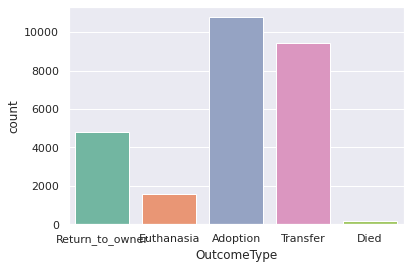

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


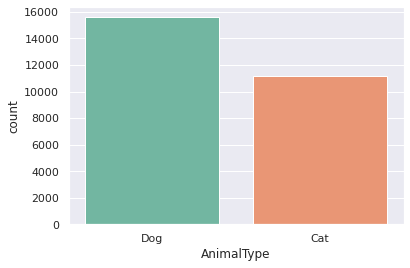

In [ ]:
import numpy as np; np.random.seed(0)
import seaborn as sns; sns.set_theme()
import matplotlib.pyplot as plt

# distribution of feature and outcomes 
sns.countplot(train_og.OutcomeType,palette='Set2')
plt.show()
sns.countplot(train_og.AnimalType,palette='Set2')
plt.show()

In [ ]:
test_og.pivot_table(index=['SexuponOutcome'], aggfunc='size')

SexuponOutcome
Intact Female    1493
Intact Male      1460
Neutered Male    4235
Spayed Female    3813
Unknown           455
dtype: int64

In [ ]:
test_og.pivot_table(index=['Breed'], aggfunc='size')

Breed
Abyssinian Mix                           1
Airedale Terrier Mix                     2
Airedale Terrier/Irish Terrier           1
Akita                                    1
Akita Mix                                7
                                        ..
Yorkshire Terrier/Miniature Poodle       3
Yorkshire Terrier/Miniature Schnauzer    2
Yorkshire Terrier/Norfolk Terrier        1
Yorkshire Terrier/Rat Terrier            2
Yorkshire Terrier/Shih Tzu               1
Length: 913, dtype: int64

In [ ]:
test_og.pivot_table(index=['Color'], aggfunc='size')

Color
Agouti                    1
Apricot                  12
Apricot/Tricolor          1
Apricot/White             2
Black                   973
                       ... 
Yellow Brindle            7
Yellow Brindle/White      7
Yellow/Gray               2
Yellow/Tan                1
Yellow/White             27
Length: 277, dtype: int64

In [ ]:
sex = train_og.pivot_table(index=['SexuponOutcome'], aggfunc='size') 
breed = train_og.pivot_table(index=['Breed'], aggfunc='size')
color = test_og.pivot_table(index=['Color'], aggfunc='size')
age = test_og.pivot_table(index=['AgeuponOutcome'], aggfunc='size')

print(sex)
print()
print(breed)
print()
print(color)
print()
print(age)

SexuponOutcome
Intact Female    3511
Intact Male      3525
Neutered Male    9779
Spayed Female    8820
Unknown          1093
dtype: int64

Breed
Abyssinian Mix                              2
Affenpinscher Mix                           6
Afghan Hound Mix                            1
Airedale Terrier                            1
Airedale Terrier Mix                        5
                                           ..
Yorkshire Terrier/Norfolk Terrier           1
Yorkshire Terrier/Parson Russell Terrier    1
Yorkshire Terrier/Pomeranian                1
Yorkshire Terrier/Rat Terrier               4
Yorkshire Terrier/Toy Poodle                1
Length: 1380, dtype: int64

Color
Agouti                    1
Apricot                  12
Apricot/Tricolor          1
Apricot/White             2
Black                   973
                       ... 
Yellow Brindle            7
Yellow Brindle/White      7
Yellow/Gray               2
Yellow/Tan                1
Yellow/White             27
Length:

### Clean1

In [ ]:
#original code

train_=pd.read_csv('train.csv',delimiter=',')
test_=pd.read_csv('test.csv',delimiter=',')
pd.options.mode.chained_assignment = None
Id_ts=test_['ID']
test_.drop('ID',axis=1,inplace=True)

#Clean Data V1
def clean(tr,ts):
    le = preprocessing.LabelEncoder()
    #Save ID
    Id_tr=tr['AnimalID']
    tr.drop('AnimalID',axis=1,inplace=True)
    
    tr['Aggressive']=0
    tr['At Vet']=0
    tr['Barn']=0
    tr['Behavior']=0
    tr['Court/Investigation']=0
    tr['Enroute']=0
    tr['Foster']=0
    tr['In Foster']=0
    tr['In Kennel']=0
    tr['In Surgery']=0
    tr['Medical']=0
    tr['Offsite']=0
    tr['Partner']=0
    tr['Rabies Risk']=0
    tr['SCRP']=0
    tr['Suffering']=0
    
    #OutcomeSubtype exploit
    tr.loc[tr.OutcomeSubtype == 'Aggressive', 'Aggressive'] = 1
    tr.loc[tr.OutcomeSubtype == 'At Vet', 'At Vet'] = 1
    tr.loc[tr.OutcomeSubtype == 'Barn', 'Barn'] = 1
    tr.loc[tr.OutcomeSubtype == 'Behavior', 'Behavior'] = 1
    tr.loc[tr.OutcomeSubtype == 'Court/Investigation', 'Court/Investigation'] = 1
    tr.loc[tr.OutcomeSubtype == 'Enroute', 'Enroute'] = 1
    tr.loc[tr.OutcomeSubtype == 'Foster', 'Foster'] = 1
    tr.loc[tr.OutcomeSubtype == 'In Foster', 'In Foster'] = 1
    tr.loc[tr.OutcomeSubtype == 'In Kennel', 'In Kennel'] = 1
    tr.loc[tr.OutcomeSubtype == 'In Surgery', 'In Surgery'] = 1
    tr.loc[tr.OutcomeSubtype == 'Medical', 'Medical'] = 1
    tr.loc[tr.OutcomeSubtype == 'Offsite', 'Offsite'] = 1
    tr.loc[tr.OutcomeSubtype == 'Partner', 'Partner'] = 1
    tr.loc[tr.OutcomeSubtype == 'Rabies Risk', 'Rabies Risk'] = 1
    tr.loc[tr.OutcomeSubtype == 'SCRP', 'SCRP'] = 1
    tr.loc[tr.OutcomeSubtype == 'Suffering', 'Suffering'] = 1
    
    global right1
    global right2
    global right3
    global right4
    global right5
    global right6
    global right7
    global right8
    global right9
    global right10
    global right11
    global right12
    global right13
    global right14
    global right15
    global right16
    
    
    right1=pd.DataFrame(tr.groupby(['Breed'])['Aggressive'].sum())
    right2=pd.DataFrame(tr.groupby(['Breed'])['At Vet'].sum())
    right3=pd.DataFrame(tr.groupby(['Breed'])['Barn'].sum())
    right4=pd.DataFrame(tr.groupby(['Breed'])['Behavior'].sum())
    right5=pd.DataFrame(tr.groupby(['Breed'])['Court/Investigation'].sum())
    right6=pd.DataFrame(tr.groupby(['Breed'])['Enroute'].sum())
    right7=pd.DataFrame(tr.groupby(['Breed'])['Foster'].sum())
    right8=pd.DataFrame(tr.groupby(['Breed'])['In Foster'].sum())
    right9=pd.DataFrame(tr.groupby(['Breed'])['In Kennel'].sum())
    right10=pd.DataFrame(tr.groupby(['Breed'])['In Surgery'].sum())
    right11=pd.DataFrame(tr.groupby(['Breed'])['Medical'].sum())
    right12=pd.DataFrame(tr.groupby(['Breed'])['Offsite'].sum())
    right13=pd.DataFrame(tr.groupby(['Breed'])['Partner'].sum())
    right14=pd.DataFrame(tr.groupby(['Breed'])['Rabies Risk'].sum())
    right15=pd.DataFrame(tr.groupby(['Breed'])['SCRP'].sum())
    right16=pd.DataFrame(tr.groupby(['Breed'])['Suffering'].sum())


    #Name Binarizer
    tr['Name_bool']=pd.isnull(tr['Name']).astype(int)
    ts['Name_bool']=pd.isnull(ts['Name']).astype(int)
    
    #OutcomeType
    tr.loc[tr.OutcomeType == 'Return_to_owner', 'Target'] = 0
    tr.loc[tr.OutcomeType == 'Euthanasia', 'Target'] = 1
    tr.loc[tr.OutcomeType == 'Adoption', 'Target'] = 2
    tr.loc[tr.OutcomeType == 'Transfer', 'Target'] = 3
    tr.loc[tr.OutcomeType == 'Died', 'Target'] = 4
    
    #Animal Binarizer
    tr.loc[tr.AnimalType == 'Dog', 'AnimalType_cat'] = 0
    tr.loc[tr.AnimalType == 'Cat', 'AnimalType_cat'] = 1
    
    ts.loc[ts.AnimalType == 'Dog', 'AnimalType_cat'] = 0
    ts.loc[ts.AnimalType == 'Cat', 'AnimalType_cat'] = 1
    
    #SexuponOutcome
    tr.loc[tr.SexuponOutcome == 'Intact Female', 'SexuponOutcome_cat'] = 0
    tr.loc[tr.SexuponOutcome == 'Spayed Female', 'SexuponOutcome_cat'] = 1
    tr.loc[tr.SexuponOutcome == 'Neutered Male', 'SexuponOutcome_cat'] = 2
    tr.loc[tr.SexuponOutcome == 'Intact Male', 'SexuponOutcome_cat'] = 3
    tr.loc[tr.SexuponOutcome == 'Unknown', 'SexuponOutcome_cat'] = 4
    
    ts.loc[ts.SexuponOutcome == 'Intact Female', 'SexuponOutcome_cat'] = 0
    ts.loc[ts.SexuponOutcome == 'Spayed Female', 'SexuponOutcome_cat'] = 1
    ts.loc[ts.SexuponOutcome == 'Neutered Male', 'SexuponOutcome_cat'] = 2
    ts.loc[ts.SexuponOutcome == 'Intact Male', 'SexuponOutcome_cat'] = 3
    ts.loc[ts.SexuponOutcome == 'Unknown', 'SexuponOutcome_cat'] = 4
    
    #Male Female
    tr.loc[tr.SexuponOutcome == 'Intact Female', 'Type_sex'] = 1
    tr.loc[tr.SexuponOutcome == 'Spayed Female', 'Type_sex'] = 1
    tr.loc[tr.SexuponOutcome == 'Neutered Male', 'Type_sex'] = 2
    tr.loc[tr.SexuponOutcome == 'Intact Male', 'Type_sex'] = 2
    tr.loc[tr.SexuponOutcome == 'Unknown', 'Type_sex'] = 3
    
    ts.loc[ts.SexuponOutcome == 'Intact Female', 'Type_sex'] = 1
    ts.loc[ts.SexuponOutcome == 'Spayed Female', 'Type_sex'] = 1
    ts.loc[ts.SexuponOutcome == 'Neutered Male', 'Type_sex'] = 2
    ts.loc[ts.SexuponOutcome == 'Intact Male', 'Type_sex'] = 2
    ts.loc[ts.SexuponOutcome == 'Unknown', 'Type_sex'] = 3
  
    #Top sprayed
    tr.loc[tr.SexuponOutcome == 'Intact Female', 'sprayed'] = 1
    tr.loc[tr.SexuponOutcome == 'Spayed Female', 'sprayed'] = 2
    tr.loc[tr.SexuponOutcome == 'Neutered Male', 'sprayed'] = 2
    tr.loc[tr.SexuponOutcome == 'Intact Male', 'sprayed'] = 1
    tr.loc[tr.SexuponOutcome == 'Unknown', 'sprayed'] = 3
    
    ts.loc[ts.SexuponOutcome == 'Intact Female', 'sprayed'] = 1
    ts.loc[ts.SexuponOutcome == 'Spayed Female', 'sprayed'] = 2
    ts.loc[ts.SexuponOutcome == 'Neutered Male', 'sprayed'] = 2
    ts.loc[ts.SexuponOutcome == 'Intact Male', 'sprayed'] = 1
    ts.loc[ts.SexuponOutcome == 'Unknown', 'sprayed'] = 3
    
    #AgeuponOutcome split + old--young
    tr['AgeuponOutcome_num']=0
    tr['AgeuponOutcome_lad']=''
    
    ts['AgeuponOutcome_num']=0
    ts['AgeuponOutcome_lad']=''
    
    for i in range(0,tr.shape[0]):
        try:
            tr['AgeuponOutcome_num'][i]=tr['AgeuponOutcome'][i].split()[0]
        except AttributeError:
            tr['AgeuponOutcome_num'][i]=0
        try:
            tr['AgeuponOutcome_lad'][i]=tr['AgeuponOutcome'][i].split()[1]
        except AttributeError:
            tr['AgeuponOutcome_lad'][i]='day'
        
    for i in range(0,ts.shape[0]):
        try:
            ts['AgeuponOutcome_num'][i]=ts['AgeuponOutcome'][i].split()[0]
        except AttributeError:
            ts['AgeuponOutcome_num'][i]=0
        try:
            ts['AgeuponOutcome_lad'][i]=ts['AgeuponOutcome'][i].split()[1]
        except AttributeError:
            ts['AgeuponOutcome_lad'][i]='day'
    
    tr.replace('year','years',inplace=True)
    tr.replace('day','days',inplace=True)
    tr.replace('month','months',inplace=True)
    tr.replace('week','weeks',inplace=True)
    ts.replace('year','years',inplace=True)
    ts.replace('day','days',inplace=True)
    ts.replace('month','months',inplace=True)
    ts.replace('week','weeks',inplace=True)
    
    for i in range(0,tr.shape[0]):
            if tr['AgeuponOutcome_lad'][i]=='years':
                tr['AgeuponOutcome_num'][i]=tr['AgeuponOutcome_num'][i]*365
            if tr['AgeuponOutcome_lad'][i]=='months':
                tr['AgeuponOutcome_num'][i]=tr['AgeuponOutcome_num'][i]*30
            if tr['AgeuponOutcome_lad'][i]=='weeks':
                tr['AgeuponOutcome_num'][i]=tr['AgeuponOutcome_num'][i]*7
    for i in range(0,ts.shape[0]):
            if ts['AgeuponOutcome_lad'][i]=='years':
                ts['AgeuponOutcome_num'][i]=ts['AgeuponOutcome_num'][i]*365
            if ts['AgeuponOutcome_lad'][i]=='months':
                ts['AgeuponOutcome_num'][i]=ts['AgeuponOutcome_num'][i]*30
            if ts['AgeuponOutcome_lad'][i]=='weeks':
                ts['AgeuponOutcome_num'][i]=ts['AgeuponOutcome_num'][i]*7
    
    tr['AgeuponOutcome_cat']=2
    ts['AgeuponOutcome_cat']=2
    
    for i in range(0,tr.shape[0]):
        if tr['AgeuponOutcome_num'][i]<=480:
            tr['AgeuponOutcome_cat'][i]=1
        if 480<tr['AgeuponOutcome_num'][i]<=2555:
            tr['AgeuponOutcome_cat'][i]=2
        if 2555<tr['AgeuponOutcome_num'][i]:
            tr['AgeuponOutcome_cat'][i]=3
    for i in range(0,ts.shape[0]):
        if ts['AgeuponOutcome_num'][i]<=480:
            ts['AgeuponOutcome_cat'][i]=1
        if 480<ts['AgeuponOutcome_num'][i]<2555:
            ts['AgeuponOutcome_cat'][i]=2
        if 2555<ts['AgeuponOutcome_num'][i]:
            ts['AgeuponOutcome_cat'][i]=3            
            
    #Breed split and bin
    tr['Breed1']=''
    tr['Breed2']=''
    tr['Breed11']=''    
    ts['Breed1']=''
    ts['Breed2']=''
    ts['Breed11']=''
    
    for i in range(0,ts.shape[0]):
        try:
            ts['Breed1'][i]=ts['Breed'][i].split('/')[0]
        except IndexError:
            ts['Breed1'][i]=ts['Breed'][i]
        try:
            ts['Breed2'][i]=ts['Breed'][i].split('/')[1]
        except IndexError:
            ts['Breed2'][i]='One_Breed'
    for i in range(0,tr.shape[0]):
        try:
            tr['Breed1'][i]=tr['Breed'][i].split('/')[0]
        except IndexError:
            tr['Breed1'][i]=tr['Breed'][i]
        try:
            tr['Breed2'][i]=tr['Breed'][i].split('/')[1]
        except IndexError:
            tr['Breed2'][i]='One_Breed'

    for i in range(0,ts.shape[0]):
        try:
            ts['Breed11'][i]=ts['Breed1'][i].split(' Mix')[0]
        except IndexError:
            ts['Breed11'][i]=ts['Breed1'][i]
    for i in range(0,tr.shape[0]):
        try:
            tr['Breed11'][i]=tr['Breed1'][i].split(' Mix')[0]
        except IndexError:
            tr['Breed11'][i]=tr['Breed1'][i]            
    
    tr['Breed11']=tr['Breed11'].str.upper()
    ts['Breed11']=ts['Breed11'].str.upper()
    
    #Mix or not Mix
    tr['Top_Mix']=0
    ts['Top_Mix']=0
    for i in range(0,tr.shape[0]):
        if tr['Breed'][i].find(' Mix') >= 0:
            tr['Top_Mix'][i]=1
            
    for i in range(0,ts.shape[0]):        
        if ts['Breed'][i].find(' Mix') >= 0:
            ts['Top_Mix'][i]=1    
        
    
    #Color split
    tr['Color1']=''
    tr['Color2']=''
    tr['Color_prin1']=''
    tr['Shade1']=''
    tr['Color_prin2']=''
    tr['Shade2']=''
    
    ts['Color1']=''
    ts['Color2']=''
    ts['Color_prin1']=''
    ts['Shade1']=''
    ts['Color_prin2']=''
    ts['Shade2']=''
    
    for i in range(0,tr.shape[0]):
        tr['Color1'][i]=tr['Color'][i].split('/')[0]
        try:
            tr['Color2'][i]=tr['Color'][i].split('/')[1]
        except IndexError:
            tr['Color2'][i]=''
        tr['Color_prin1'][i]=tr['Color1'][i].split(' ')[0]
        try:
            tr['Shade1'][i]=tr['Color1'][i].split(' ')[1]
        except IndexError:
            tr['Shade1'][i]=''        
        tr['Color_prin2'][i]=tr['Color2'][i].split(' ')[0]
        try:    
            tr['Shade2'][i]=tr['Color2'][i].split(' ')[1]
        except IndexError:
            tr['Shade2'][i]=''
            
            
    for i in range(0,ts.shape[0]):        
        ts['Color1'][i]=ts['Color'][i].split('/')[0]
        try:
            ts['Color2'][i]=ts['Color'][i].split('/')[1]
        except IndexError:
            ts['Color2'][i]=''
        ts['Color_prin1'][i]=ts['Color1'][i].split(' ')[0]
        try:
            ts['Shade1'][i]=ts['Color1'][i].split(' ')[1]
        except IndexError:
            ts['Shade1'][i]=''        
        ts['Color_prin2'][i]=ts['Color2'][i].split(' ')[0]
        try: 
            ts['Shade2'][i]=ts['Color2'][i].split(' ')[1]
        except IndexError:
            ts['Shade2'][i]=''  

    #UniColor
    tr['Unicolor']=0
    ts['Unicolor']=0
    
    for i in range(0,tr.shape[0]):
         if tr['Color2'][i]=='':
            tr['Unicolor'][i]=1

    for i in range(0,ts.shape[0]):
         if ts['Color2'][i]=='':
            ts['Unicolor'][i]=1
            
    #Datetime
    tr['year'] = pd.DatetimeIndex(tr['DateTime']).year
    tr['month'] = pd.DatetimeIndex(tr['DateTime']).month
    tr['day'] = pd.DatetimeIndex(tr['DateTime']).day
    tr['hour'] = pd.DatetimeIndex(tr['DateTime']).hour
    tr['minute'] = pd.DatetimeIndex(tr['DateTime']).minute
    tr['dayofweek'] = pd.DatetimeIndex(tr['DateTime']).dayofweek
    tr['quarter'] = pd.DatetimeIndex(tr['DateTime']).quarter
    tr['weekofyear'] = pd.DatetimeIndex(tr['DateTime']).weekofyear

    ts['year'] = pd.DatetimeIndex(ts['DateTime']).year
    ts['month'] = pd.DatetimeIndex(ts['DateTime']).month
    ts['day'] = pd.DatetimeIndex(ts['DateTime']).day
    ts['hour'] = pd.DatetimeIndex(ts['DateTime']).hour
    ts['minute'] = pd.DatetimeIndex(ts['DateTime']).minute
    ts['dayofweek'] = pd.DatetimeIndex(ts['DateTime']).dayofweek
    ts['quarter'] = pd.DatetimeIndex(ts['DateTime']).quarter
    ts['weekofyear'] = pd.DatetimeIndex(ts['DateTime']).weekofyear
    
    tr['am_pm']=0
    ts['am_pm']=0
    
    for i in range(0,tr.shape[0]):
        if 8<=tr['hour'][i]<=11:
            tr['am_pm'][i]=1
        if 12<=tr['hour'][i]<=14:
            tr['am_pm'][i]=2
        if 14<=tr['hour'][i]<=18:
            tr['am_pm'][i]=3
        if 18<tr['hour'][i]:
            tr['am_pm'][i]=4
    for i in range(0,ts.shape[0]):
        if 8<=ts['hour'][i]<=11:
            ts['am_pm'][i]=1
        if 12<=ts['hour'][i]<=14:
            ts['am_pm'][i]=2
        if 14<=ts['hour'][i]<=18:
            ts['am_pm'][i]=3
        if 18<tr['hour'][i]:
            ts['am_pm'][i]=4               
    #Season
    tr['Season']=0
    ts['Season']=0
    
    for i in range(0,ts.shape[0]):
            if 4<=ts['month'][i]<=6:
                ts['Season'][i]=1
            if 7<=ts['month'][i]<=9:
                ts['Season'][i]=2
            if 10<=ts['month'][i]<=12:
                ts['Season'][i]=3
    for i in range(0,tr.shape[0]):
            if 4<=tr['month'][i]<=6:
                tr['Season'][i]=1
            if 7<=tr['month'][i]<=9:
                tr['Season'][i]=2
            if 10<=tr['month'][i]<=12:
                tr['Season'][i]=3
                
    #Holidays
    tr['Holidays']=0
    ts['Holidays']=0
    
    for i in range(0,tr.shape[0]):
            #confederate Heroes
            if tr['month'][i]==1 and tr['day'][i]==19:
                 tr['Holidays'][i]=1
            #Texas Independance
            if tr['month'][i]==3 and tr['day'][i]==2:
                 tr['Holidays'][i]=2
            #San Jacinto Day        
            if tr['month'][i]==4 and tr['day'][i]==21:
                 tr['Holidays'][i]=3                       
            #Mothers Day        
            if tr['month'][i]==5 and tr['day'][i]==10:
                 tr['Holidays'][i]=4                       
            #Emancipation Day        
            if tr['month'][i]==6 and tr['day'][i]==19:
                 tr['Holidays'][i]=5
            #Fathers Day        
            if tr['month'][i]==6 and 18<=tr['day'][i]<=22:
                 tr['Holidays'][i]=6
            #Lyndon day       
            if tr['month'][i]==8 and tr['day'][i]==27:
                 tr['Holidays'][i]=7                       
            #Veterans day       
            if tr['month'][i]==11 and tr['day'][i]==11:
                 tr['Holidays'][i]=8 
            #ThanksGiving                    
            if tr['month'][i]==11 and 25<=tr['day'][i]<=27:
                 tr['Holidays'][i]=9
            #Christmas                    
            if tr['month'][i]==12 and 23<=tr['day'][i]<=27:
                 tr['Holidays'][i]=10                        
                    
                    
    for i in range(0,ts.shape[0]):
            #confederate Heroes
            if ts['month'][i]==1 and ts['day'][i]==19:
                 ts['Holidays'][i]=1
            #Texas Independance
            if ts['month'][i]==3 and ts['day'][i]==2:
                 ts['Holidays'][i]=2
            #San Jacinto Day        
            if ts['month'][i]==4 and ts['day'][i]==21:
                 ts['Holidays'][i]=3                       
            #Mothers Day        
            if ts['month'][i]==5 and ts['day'][i]==10:
                 ts['Holidays'][i]=4                       
            #Emancipation Day        
            if ts['month'][i]==6 and ts['day'][i]==19:
                 ts['Holidays'][i]=5
            #Fathers Day        
            if ts['month'][i]==6 and 18<=ts['day'][i]<=22:
                 ts['Holidays'][i]=6
            #Lyndon day       
            if ts['month'][i]==8 and ts['day'][i]==27:
                 ts['Holidays'][i]=7                       
            #Veterans day       
            if ts['month'][i]==11 and ts['day'][i]==11:
                 ts['Holidays'][i]=8 
            #ThanksGiving                    
            if ts['month'][i]==11 and 25<=ts['day'][i]<=27:
                 ts['Holidays'][i]=9
            #Christmas                    
            if ts['month'][i]==12 and 23<=ts['day'][i]<=27:
                 ts['Holidays'][i]=10   

    global left1
    global left2
    global left3
    global left4
    global left5
    global left6
    global left7
    global left8
    global left9
    global left10
    global left11
    global left12
    global left13
    global left14
    global left15
    global left16

    left1=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['Aggressive'].sum())
    left2=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['At Vet'].sum())
    left3=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['Barn'].sum())
    left4=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['Behavior'].sum())
    left5=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['Court/Investigation'].sum())
    left6=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['Enroute'].sum())
    left7=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['Foster'].sum())
    left8=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['In Foster'].sum())
    left9=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['In Kennel'].sum())
    left10=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['In Surgery'].sum())
    left11=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['Medical'].sum())
    left12=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['Offsite'].sum())
    left13=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['Partner'].sum())
    left14=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['Rabies Risk'].sum())
    left15=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['SCRP'].sum())
    left16=pd.DataFrame(tr.groupby(['AgeuponOutcome_num'])['Suffering'].sum())   
    
    global a1
    global a2
    global a3
    global a4
    global a5
    global a6
    global a7
    global a8
    global a9
    global a10
    global a11
    global a12
    global a13
    global a14
    global a15
    global a16

    a1=pd.DataFrame(tr.groupby(['Breed11'])['Aggressive'].sum())
    a2=pd.DataFrame(tr.groupby(['Breed11'])['At Vet'].sum())
    a3=pd.DataFrame(tr.groupby(['Breed11'])['Barn'].sum())
    a4=pd.DataFrame(tr.groupby(['Breed11'])['Behavior'].sum())
    a5=pd.DataFrame(tr.groupby(['Breed11'])['Court/Investigation'].sum())
    a6=pd.DataFrame(tr.groupby(['Breed11'])['Enroute'].sum())
    a7=pd.DataFrame(tr.groupby(['Breed11'])['Foster'].sum())
    a8=pd.DataFrame(tr.groupby(['Breed11'])['In Foster'].sum())
    a9=pd.DataFrame(tr.groupby(['Breed11'])['In Kennel'].sum())
    a10=pd.DataFrame(tr.groupby(['Breed11'])['In Surgery'].sum())
    a11=pd.DataFrame(tr.groupby(['Breed11'])['Medical'].sum())
    a12=pd.DataFrame(tr.groupby(['Breed11'])['Offsite'].sum())
    a13=pd.DataFrame(tr.groupby(['Breed11'])['Partner'].sum())
    a14=pd.DataFrame(tr.groupby(['Breed11'])['Rabies Risk'].sum())
    a15=pd.DataFrame(tr.groupby(['Breed11'])['SCRP'].sum())
    a16=pd.DataFrame(tr.groupby(['Breed11'])['Suffering'].sum())

                
    return tr.shape, ts.shape, tr, ts, a1,a2

cleaned = clean(train_,test_)

train1 = train_.copy()
test1 = test_.copy()
cleaned

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:334: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:343: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)


((26729, 56),
 (11456, 37),
           Name             DateTime      OutcomeType  ... am_pm Season Holidays
 0      Hambone  2014-02-12 18:22:00  Return_to_owner  ...     3      0        0
 1        Emily  2013-10-13 12:44:00       Euthanasia  ...     2      3        0
 2       Pearce  2015-01-31 12:28:00         Adoption  ...     2      0        0
 3          NaN  2014-07-11 19:09:00         Transfer  ...     4      2        0
 4          NaN  2013-11-15 12:52:00         Transfer  ...     2      3        0
 ...        ...                  ...              ...  ...   ...    ...      ...
 26724      NaN  2015-05-14 11:56:00         Transfer  ...     1      1        0
 26725      NaN  2016-01-20 18:59:00         Transfer  ...     3      0        0
 26726     Zeus  2015-03-09 13:33:00         Adoption  ...     2      0        0
 26727      NaN  2014-04-27 12:22:00         Transfer  ...     2      1        0
 26728      NaN  2015-07-02 09:00:00         Transfer  ...     1      2        0


In [ ]:
# checking to see which breed is most likely to be labeled aggresie 
cleaned[4]['Aggressive']
for n in range(0, len(cleaned[4]['Aggressive'])):
  if cleaned[4]['Aggressive'][n] == 160:
    print(cleaned[4]['Aggressive'].index[n])

PIT BULL


In [ ]:
train1.columns

Index(['Name', 'DateTime', 'OutcomeType', 'OutcomeSubtype', 'AnimalType',
       'SexuponOutcome', 'AgeuponOutcome', 'Breed', 'Color', 'Aggressive',
       'At Vet', 'Barn', 'Behavior', 'Court/Investigation', 'Enroute',
       'Foster', 'In Foster', 'In Kennel', 'In Surgery', 'Medical', 'Offsite',
       'Partner', 'Rabies Risk', 'SCRP', 'Suffering', 'Name_bool', 'Target',
       'AnimalType_cat', 'SexuponOutcome_cat', 'Type_sex', 'sprayed',
       'AgeuponOutcome_num', 'AgeuponOutcome_lad', 'AgeuponOutcome_cat',
       'Breed1', 'Breed2', 'Breed11', 'Top_Mix', 'Color1', 'Color2',
       'Color_prin1', 'Shade1', 'Color_prin2', 'Shade2', 'Unicolor', 'year',
       'month', 'day', 'hour', 'minute', 'dayofweek', 'quarter', 'weekofyear',
       'am_pm', 'Season', 'Holidays'],
      dtype='object')

In [ ]:
#original code

Target=train_['Target']
train_.drop('OutcomeSubtype',axis=1,inplace=True)
train_.drop('Aggressive',axis=1,inplace=True)
train_.drop('At Vet',axis=1,inplace=True)
train_.drop('Barn',axis=1,inplace=True)
train_.drop('Behavior',axis=1,inplace=True)
train_.drop('Court/Investigation',axis=1,inplace=True)
train_.drop('Enroute',axis=1,inplace=True)
train_.drop('Foster',axis=1,inplace=True)
train_.drop('In Foster',axis=1,inplace=True)
train_.drop('In Kennel',axis=1,inplace=True)
train_.drop('In Surgery',axis=1,inplace=True)
train_.drop('Medical',axis=1,inplace=True)
train_.drop('Offsite',axis=1,inplace=True)
train_.drop('Partner',axis=1,inplace=True)
train_.drop('Rabies Risk',axis=1,inplace=True)
train_.drop('SCRP',axis=1,inplace=True)
train_.drop('Suffering',axis=1,inplace=True)
train_.drop('OutcomeType',axis=1,inplace=True)
train_.drop('Target',axis=1,inplace=True)

### Clean2

In [ ]:
#original code

#Clean Data V2
def clean_v2(train):
	l1=['American Hairless Terrier','American Leopard Hound','Appenzeller Sennenhunde','Azawakh','Barbet','Basset Fauve de Bretagne','Belgian Laekenois','Biewer Terrier','Bolognese','Bracco Italiano','Braque du Bourbonnais','Broholmer','Catahoula Leopard Dog','Caucasian Ovcharka','Central Asian Shepherd Dog','Czechoslovakian Vlcak','Danish-Swedish Farmdog','Deutscher Wachtelhund','Dogo Argentino','Drentsche Patrijshond','Drever','Dutch Shepherd','Estrela Mountain Dog','Eurasier','French Spaniel','German Longhaired Pointer','German Spitz','Grand Basset Griffon Vendeen','Hamiltonstovare','Hovawart','Jagdterrier','Jindo','Kai Ken','Karelian Bear Dog','Kishu Ken','Kromfohrlander','Lancashire Heeler','Mudi','Nederlandse Kooikerhondje','Norrbottenspets','Perro de Presa Canario','Peruvian Inca Orchid','Portuguese Podengo','Portuguese Pointer','Portuguese Sheepdog','Pumi','Pyrenean Mastiff','Rafeiro do Alentejo','Russian Toy','Russian Tsvetnaya Bolonka','Schapendoes','Shikoku','Slovensky Cuvac','Slovensky Kopov','Sloughi','Small Munsterlander Pointer','Spanish Mastiff','Stabyhoun','Swedish Lapphund','Thai Ridgeback','Tornjak','Tosa','Transylvanian Hound','Treeing Tennessee Brindle','Working Kelpie','Australian Cattle Dog','Australian Shepherd','Bearded Collie','Beauceron','Belgian Malinois','Belgian Sheepdog','Belgian Tervuren','Bergamasco','Berger Picard','Border Collie','Bouvier des Flandres','Briard','Canaan Dog','Cardigan Welsh Corgi','Collie','Entlebucher Mountain Dog','Finnish Lapphund','German Shepherd Dog','Icelandic Sheepdog','Miniature American Shepherd','Norwegian Buhund','Old English Sheepdog','Pembroke Welsh Corgi','Polish Lowland Sheepdog','Puli','Pyrenean Shepherd','Shetland Sheepdog','Spanish Water Dog','Swedish Vallhund','Afghan Hound','American English Coonhound','American Foxhound','Basenji','Basset Hound','Beagle','Black and Tan Coonhound','Bloodhound','Bluetick Coonhound','Borzoi','Cirneco de l etna','Dachshund','English Foxhound','Greyhound','Harrier','Ibizan Hound','Irish Wolfhound','Norwegian Elkhound','Otterhound','Petit Basset Griffon Vendeen','Pharaoh Hound','Plott','Portuguese Podengo Pequeno','Redbone Coonhound','Rhodesian Ridgeback','Saluki','Scottish Deerhound','Treeing Walker Coonhound','Whippet','American Eskimo Dog','Bichon Frise','Boston Terrier','Bulldog','Chinese Shar-Pei','Chow Chow','Coton de Tulear','Dalmatian','Finnish Spitz','French Bulldog','Keeshond','Lhasa Apso','Lowchen','Norwegian Lundehund','Poodle','Schipperke','Shiba Inu','Tibetan Spaniel','Tibetan Terrier','Xoloitzcuintli','American Water Spaniel','Boykin Spaniel','Brittany','Chesapeake Bay Retriever','Clumber Spaniel','Cocker Spaniel','Curly-Coated Retriever','English Cocker Spaniel','English Setter','English Springer Spaniel','Field Spaniel','Flat-Coated Retriever','German Shorthaired Pointer','German Wirehaired Pointer','Golden Retriever','Gordon Setter','Irish Red and White Setter','Irish Setter','Irish Water Spaniel','Labrador Retriever','Lagotto Romagnolo','Nova Scotia Duck Tolling Retriever','Pointer','Spinone Italiano','Sussex Spaniel','Vizsla','Weimaraner','Welsh Springer Spaniel','Wirehaired Pointing Griffon','Wirehaired Vizsla','Airedale Terrier','American Staffordshire Terrier','Australian Terrier','Bedlington Terrier','Border Terrier','Bull Terrier','Cairn Terrier','Cesky Terrier','Dandie Dinmont Terrier','Glen of Imaal Terrier','Irish Terrier','Kerry Blue Terrier','Lakeland Terrier','Manchester Terrier','Miniature Bull Terrier','Miniature Schnauzer','Norfolk Terrier','Norwich Terrier','Parson Russell Terrier','Rat Terrier','Russell Terrier','Scottish Terrier','Sealyham Terrier','Skye Terrier','Smooth Fox Terrier','Soft Coated Wheaten Terrier','Staffordshire Bull Terrier','Welsh Terrier','West Highland White Terrier','Wire Fox Terrier','Affenpinscher','Brussels Griffon','Cavalier King Charles Spaniel','Chihuahua','Chinese Crested','English Toy Spaniel','Havanese','Italian Greyhound','Japanese Chin','Maltese','Miniature Pinscher','Papillon','Pekingese','Pomeranian','Pug','Shih Tzu','Silky Terrier','Toy Fox Terrier','Yorkshire Terrier','Akita','Alaskan Malamute','Anatolian Shepherd Dog','Bernese Mountain Dog','Black Russian Terrier','Boerboel','Boxer','Bullmastiff','Cane Corso','Chinook','Doberman Pinscher','Dogue de Bordeaux','German Pinscher','Giant Schnauzer','Great Dane','Great Pyrenees','Greater Swiss Mountain Dog','Komondor','Kuvasz','Leonberger','Mastiff','Neapolitan Mastiff','Newfoundland','Portuguese Water Dog','Rottweiler','Samoyed','Siberian Husky','Standard Schnauzer','Tibetan Mastiff','St. Bernard']
	l2=['FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','FSS','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Herding','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Hound','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Non_sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Sporting','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Terrier','Toy','Toy','Toy','Toy','Toy','Toy','Toy','Toy','Toy','Toy','Toy','Toy','Toy','Toy','Toy','Toy','Toy','Toy','Toy','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working','Working']
	
	l3=pd.DataFrame(l1)
	l3['Groups']=pd.DataFrame(l1)
	l3['Breed11']=pd.DataFrame(l2)
	l3.drop(0,axis=1,inplace=True)
	l3['Breed11']=l3['Breed11'].str.upper()
	
	#2013
	l4=['LABRADOR RETRIEVER','GERMAN SHEPHERD','GOLDEN RETRIEVER','AMERICAN BULLDOG','BEAGLE','FRENCH BULLDOG','YORKSHIRE TERRIER','MINIATURE POODLE','ROTTWEILER','BOXER','German Shorthair Pointer','SIBERIAN HUSKY','DACHSHUND','Pinscher','GREAT DANES','MINIATURE SCHNAUZER','AUSTRALIAN SHEPHERD','CAVALIER KING CHARLES SPANIEL','SHIH TZU','PEMBROKE WELSH CORGI','POMERANIAN','BOSTON TERRIER','SHETLAND SHEEPDOG','HAVANESE','MASTIFF','BRITTANY','ENGLISH SPRINGER SPANIEL','CHIHUAHUA','BERNESE MOUNTAIN DOG','COCKER SPANIEL','MALTESE','VIZSLA','PUG','WEIMARANER','CANE CORSO','COLLIE','NEWFOUNDLAND','BORDER COLLIE','BASSET HOUND','RHODESIAN RIDGEBACK','WEST HIGHLAND WHITE TERRIER','CHESAPEAKE BAY RETRIEVER','BULLMASTIFF','BICHON FRISE','SHIBA INU','AKITA','SOFT COATED WHEATEN TERRIER','PAPILLON','BLOODHOUND','St. Bernard Smooth Coat','St. Bernard Rough Coat','BELGIAN MALINOIS','PORTUGUESE WATER DOG','AIREDALE TERRIER','ALASKAN MALAMUTE','BULL TERRIER','AUSTRALIAN CATTLE DOG','WHIPPET','SCOTTISH TERRIER','CHINESE SHARPEI','ENGLISH COCKER SPANIEL','SAMOYED','DALMATIAN','DOGUE DE BORDEAUX','MINIATURE PINSCHER','LHASA APSO','WIREHAIRED POINTING GRIFFON','GREAT PYRENEES','GERMAN WIREHAIRED POINTER','IRISH WOLFHOUND','CAIRN TERRIER','ITALIAN GREYHOUND','IRISH SETTER','CHOW CHOW','OLD ENGLISH SHEEPDOG','CHINESE CRESTED','CARDIGAN WELSH CORGI','AMERICAN STAFFORDSHIRE TERRIER','GREATER SWISS MOUNTAIN DOG','STAFFORDSHIRE BULL TERRIER','PEKINGESE','GIANT SCHNAUZER','BORDER TERRIER','BOUVIER DES FLANDRES','KEESHONDEN','COTON DE TULEAR','FLAT COAT RETRIEVER','BASENJI','NORWEGIAN ELKHOUND','BORZOI','TIBETAN TERRIER','STANDARD SCHNAUZER','ANATOLIAN SHEPHERD DOG','LEONBERGER','WIRE FOX TERRIER','BRUSSELS GRIFFON','ENGLISH SETTER','JAPANESE CHIN','BELGIAN TERVUREN','NOVA SCOTIA DUCK TOLLING RETRIEVER','AFGHAN HOUND','RAT TERRIER','SILKY TERRIER','NORWICH TERRIER','RUSSELL TERRIER','GORDON SETTER','NEAPOLITAN MASTIFF','BOYKIN SPANIEL','WELSH TERRIER','SCHIPPERKE','TOY FOX TERRIER','PARSON RUSSELL TERRIER','SPINONI ITALIANI','IRISH TERRIER','POINTER','TIBETAN SPANIEL','BLACK RUSSIAN TERRIER','TREEING WALKER COONHOUND','AMERICAN ESKIMO DOG','BEARDED COLLIE','BELGIAN SHEEPDOG','MINIATURE BULL TERRIER','SMOOTH FOX TERRIER','BLUETICK COONHOUND','KERRY BLUE TERRIER','AUSTRALIAN TERRIER','BOERBOEL','BLACK AND TAN COONHOUND','WELSH SPRINGER SPANIEL','ENGLISH TOY SPANIEL','BRIARD','NORFOLK TERRIER','SALUKI','TIBETAN MASTIFF','CLUMBER SPANIEL','XOLOITZCUINTLI','AFFENPINSCHER','MANCHESTER TERRIER','GERMAN PINSCHER','REDBONE COONHOUND','ICELANDIC SHEEPDO','LAKELAND TERRIER','BEAUCERON','PETIT BASSET GRIFFON VENDEEN','IRISH WATER SPANIEL','FIELD SPANIEL','BEDLINGTON TERRIER','GREYHOUND','IRISH RED AND WHITE SETTER','PLOTT','KUVASZOK','CURLY COAT RETRIEVER','SCOTTISH DEERHOUND','PORTUGUESE PODENGO PEQUENO','PULIK','SWEDISH VALLHUND','WIREHAIRED VIZSLA','AMERICAN WATER SPANIEL','SEALYHAM TERRIER','ENTLEBUCHER MOUNTAIN DOG','IBIZAN HOUND','LOWCHEN','CIRNECHI DE L ETNA','KOMONDOROK','POLISH LOWLAND SHEEPDOG','NORWEGIAN BUHUND','AMERICAN ENGLISH COONHOUND','SPANISH WATER DOG','GLEN OF IMAAL TERRIER','FINNISH LAPPHUND','CANAAN DOG','PHARAOH HOUND','DANDIE DINMONT TERRIER','SUSSEX SPANIEL','BERGAMASCO','SKYE TERRIER','PYRENEAN SHEPHERD','CHINOOK','FINNISH SPITZ','CESKY TERRIER','OTTERHOUND','AMERICAN FOXHOUND','NORWEGIAN LUNDEHUND','HARRIER','ENGLISH FOXHOUND']
	l5=['1','2','3','5','4','11','6','8','9','7','13','14','10','12','16','17','20','18','15','24','19','23','21','25','26','30','28','22','32','29','27','34','31','33','50','35','37','44','41','39','36','43','40','40','46','45','51','38','48','47','47','60','49','56','57','52','58','59','55','54','62','67','64','65','53','63','80','69','71','73','61','66','72','70','78','68','75','76','74','79','77','83','81','82','86','-9999','94','85','103','99','88','90','93','98','96','84','91','87','108','97','95','-9999','92','89','102','105','111','121','104','109','107','100','117','123','114','106','118','101','110','112','119','125','116','128','126','122','-9999','113','124','135','127','129','115','132','131','139','143','120','130','133','142','134','152','138','141','140','137','148','145','149','150','163','165','153','136','147','-9999','144','158','155','151','154','-9999','159','157','166','146','-9999','167','171','164','160','168','162','-9999','161','169','156','170','174','172','176','175','173','177']
	
	l6=pd.DataFrame(l4)
	l6['Breed11']=pd.DataFrame(l4)
	l6['Classement_2013']=pd.DataFrame(l5)
	l6.drop(0,axis=1,inplace=True)
	l6['Breed11']=l6['Breed11'].str.upper()
	
	#2014
	l7=['LABRADOR RETRIEVER','GERMAN SHEPHERD','GOLDEN RETRIEVER','AMERICAN BULLDOG','BEAGLE','FRENCH BULLDOG','YORKSHIRE TERRIER','MINIATURE POODLE','ROTTWEILER','BOXER','German Shorthair Pointer','SIBERIAN HUSKY','DACHSHUND','Pinscher','GREAT DANES','MINIATURE SCHNAUZER','AUSTRALIAN SHEPHERD','CAVALIER KING CHARLES SPANIEL','SHIH TZU','PEMBROKE WELSH CORGI','POMERANIAN','BOSTON TERRIER','SHETLAND SHEEPDOG','HAVANESE','MASTIFF','BRITTANY','ENGLISH SPRINGER SPANIEL','CHIHUAHUA','BERNESE MOUNTAIN DOG','COCKER SPANIEL','MALTESE','VIZSLA','PUG','WEIMARANER','CANE CORSO','COLLIE','NEWFOUNDLAND','BORDER COLLIE','BASSET HOUND','RHODESIAN RIDGEBACK','WEST HIGHLAND WHITE TERRIER','CHESAPEAKE BAY RETRIEVER','BULLMASTIFF','BICHON FRISE','SHIBA INU','AKITA','SOFT COATED WHEATEN TERRIER','PAPILLON','BLOODHOUND','St. Bernard Smooth Coat','St. Bernard Rough Coat','BELGIAN MALINOIS','PORTUGUESE WATER DOG','AIREDALE TERRIER','ALASKAN MALAMUTE','BULL TERRIER','AUSTRALIAN CATTLE DOG','WHIPPET','SCOTTISH TERRIER','CHINESE SHARPEI','ENGLISH COCKER SPANIEL','SAMOYED','DALMATIAN','DOGUE DE BORDEAUX','MINIATURE PINSCHER','LHASA APSO','WIREHAIRED POINTING GRIFFON','GREAT PYRENEES','GERMAN WIREHAIRED POINTER','IRISH WOLFHOUND','CAIRN TERRIER','ITALIAN GREYHOUND','IRISH SETTER','CHOW CHOW','OLD ENGLISH SHEEPDOG','CHINESE CRESTED','CARDIGAN WELSH CORGI','AMERICAN STAFFORDSHIRE TERRIER','GREATER SWISS MOUNTAIN DOG','STAFFORDSHIRE BULL TERRIER','PEKINGESE','GIANT SCHNAUZER','BORDER TERRIER','BOUVIER DES FLANDRES','KEESHONDEN','COTON DE TULEAR','FLAT COAT RETRIEVER','BASENJI','NORWEGIAN ELKHOUND','BORZOI','TIBETAN TERRIER','STANDARD SCHNAUZER','ANATOLIAN SHEPHERD DOG','LEONBERGER','WIRE FOX TERRIER','BRUSSELS GRIFFON','ENGLISH SETTER','JAPANESE CHIN','BELGIAN TERVUREN','NOVA SCOTIA DUCK TOLLING RETRIEVER','AFGHAN HOUND','RAT TERRIER','SILKY TERRIER','NORWICH TERRIER','RUSSELL TERRIER','GORDON SETTER','NEAPOLITAN MASTIFF','BOYKIN SPANIEL','WELSH TERRIER','SCHIPPERKE','TOY FOX TERRIER','PARSON RUSSELL TERRIER','SPINONI ITALIANI','IRISH TERRIER','POINTER','TIBETAN SPANIEL','BLACK RUSSIAN TERRIER','TREEING WALKER COONHOUND','AMERICAN ESKIMO DOG','BEARDED COLLIE','BELGIAN SHEEPDOG','MINIATURE BULL TERRIER','SMOOTH FOX TERRIER','BLUETICK COONHOUND','KERRY BLUE TERRIER','AUSTRALIAN TERRIER','BOERBOEL','BLACK AND TAN COONHOUND','WELSH SPRINGER SPANIEL','ENGLISH TOY SPANIEL','BRIARD','NORFOLK TERRIER','SALUKI','TIBETAN MASTIFF','CLUMBER SPANIEL','XOLOITZCUINTLI','AFFENPINSCHER','MANCHESTER TERRIER','GERMAN PINSCHER','REDBONE COONHOUND','ICELANDIC SHEEPDO','LAKELAND TERRIER','BEAUCERON','PETIT BASSET GRIFFON VENDEEN','IRISH WATER SPANIEL','FIELD SPANIEL','BEDLINGTON TERRIER','GREYHOUND','IRISH RED AND WHITE SETTER','PLOTT','KUVASZOK','CURLY COAT RETRIEVER','SCOTTISH DEERHOUND','PORTUGUESE PODENGO PEQUENO','PULIK','SWEDISH VALLHUND','WIREHAIRED VIZSLA','AMERICAN WATER SPANIEL','SEALYHAM TERRIER','ENTLEBUCHER MOUNTAIN DOG','IBIZAN HOUND','LOWCHEN','CIRNECHI DE L ETNA','KOMONDOROK','POLISH LOWLAND SHEEPDOG','NORWEGIAN BUHUND','AMERICAN ENGLISH COONHOUND','SPANISH WATER DOG','GLEN OF IMAAL TERRIER','FINNISH LAPPHUND','CANAAN DOG','PHARAOH HOUND','DANDIE DINMONT TERRIER','SUSSEX SPANIEL','BERGAMASCO','SKYE TERRIER','PYRENEAN SHEPHERD','CHINOOK','FINNISH SPITZ','CESKY TERRIER','OTTERHOUND','AMERICAN FOXHOUND','NORWEGIAN LUNDEHUND','HARRIER','ENGLISH FOXHOUND']
	l8=['1','2','3','4','5','9','6','7','10','8','12','13','11','14','15','16','18','19','17','22','20','23','21','25','26','27','28','24','32','30','29','34','33','35','48','36','37','40','42','39','38','41','45','44','47','46','49','43','50','51','51','60','52','57','54','53','55','56','59','58','62','68','66','63','61','67','76','75','71','72','69','74','73','70','77','65','78','84','80','79','82','83','85','81','87','31','92','86','103','102','88','90','94','104','95','91','89','93','110','99','98','111','101','97','105','100','114','108','106','109','115','116','118','125','119','122','127','112','120','121','123','129','124','130','128','139','64','126','133','138','132','131','134','135','143','142','144','136','141','148','146','149','145','150','152','137','140','147','155','154','161','163','157','166','151','158','107','160','169','153','159','165','117','168','170','172','156','113','162','173','176','164','167','175','96','177','178','171','174','182','179','180','184','181','183']
	
	l9=pd.DataFrame(l7)
	l9['Breed11']=pd.DataFrame(l7)
	l9['Classement_2014']=pd.DataFrame(l8)
	l9.drop(0,axis=1,inplace=True)
	l9['Breed11']=l9['Breed11'].str.upper()
	
	#2015
	l10=['LABRADOR RETRIEVER','GERMAN SHEPHERD','GOLDEN RETRIEVER','AMERICAN BULLDOG','BEAGLE','FRENCH BULLDOG','YORKSHIRE TERRIER','MINIATURE POODLE','ROTTWEILER','BOXER','German Shorthair Pointer','SIBERIAN HUSKY','DACHSHUND','Pinscher','GREAT DANES','MINIATURE SCHNAUZER','AUSTRALIAN SHEPHERD','CAVALIER KING CHARLES SPANIEL','SHIH TZU','PEMBROKE WELSH CORGI','POMERANIAN','BOSTON TERRIER','SHETLAND SHEEPDOG','HAVANESE','MASTIFF','BRITTANY','ENGLISH SPRINGER SPANIEL','CHIHUAHUA','BERNESE MOUNTAIN DOG','COCKER SPANIEL','MALTESE','VIZSLA','PUG','WEIMARANER','CANE CORSO','COLLIE','NEWFOUNDLAND','BORDER COLLIE','BASSET HOUND','RHODESIAN RIDGEBACK','WEST HIGHLAND WHITE TERRIER','CHESAPEAKE BAY RETRIEVER','BULLMASTIFF','BICHON FRISE','SHIBA INU','AKITA','SOFT COATED WHEATEN TERRIER','PAPILLON','BLOODHOUND','St. Bernard Smooth Coat','St. Bernard Rough Coat','BELGIAN MALINOIS','PORTUGUESE WATER DOG','AIREDALE TERRIER','ALASKAN MALAMUTE','BULL TERRIER','AUSTRALIAN CATTLE DOG','WHIPPET','SCOTTISH TERRIER','CHINESE SHARPEI','ENGLISH COCKER SPANIEL','SAMOYED','DALMATIAN','DOGUE DE BORDEAUX','MINIATURE PINSCHER','LHASA APSO','WIREHAIRED POINTING GRIFFON','GREAT PYRENEES','GERMAN WIREHAIRED POINTER','IRISH WOLFHOUND','CAIRN TERRIER','ITALIAN GREYHOUND','IRISH SETTER','CHOW CHOW','OLD ENGLISH SHEEPDOG','CHINESE CRESTED','CARDIGAN WELSH CORGI','AMERICAN STAFFORDSHIRE TERRIER','GREATER SWISS MOUNTAIN DOG','STAFFORDSHIRE BULL TERRIER','PEKINGESE','GIANT SCHNAUZER','BORDER TERRIER','BOUVIER DES FLANDRES','KEESHONDEN','COTON DE TULEAR','FLAT COAT RETRIEVER','BASENJI','NORWEGIAN ELKHOUND','BORZOI','TIBETAN TERRIER','STANDARD SCHNAUZER','ANATOLIAN SHEPHERD DOG','LEONBERGER','WIRE FOX TERRIER','BRUSSELS GRIFFON','ENGLISH SETTER','JAPANESE CHIN','BELGIAN TERVUREN','NOVA SCOTIA DUCK TOLLING RETRIEVER','AFGHAN HOUND','RAT TERRIER','SILKY TERRIER','NORWICH TERRIER','RUSSELL TERRIER','GORDON SETTER','NEAPOLITAN MASTIFF','BOYKIN SPANIEL','WELSH TERRIER','SCHIPPERKE','TOY FOX TERRIER','PARSON RUSSELL TERRIER','SPINONI ITALIANI','IRISH TERRIER','POINTER','TIBETAN SPANIEL','BLACK RUSSIAN TERRIER','TREEING WALKER COONHOUND','AMERICAN ESKIMO DOG','BEARDED COLLIE','BELGIAN SHEEPDOG','MINIATURE BULL TERRIER','SMOOTH FOX TERRIER','BLUETICK COONHOUND','KERRY BLUE TERRIER','AUSTRALIAN TERRIER','BOERBOEL','BLACK AND TAN COONHOUND','WELSH SPRINGER SPANIEL','ENGLISH TOY SPANIEL','BRIARD','NORFOLK TERRIER','SALUKI','TIBETAN MASTIFF','CLUMBER SPANIEL','XOLOITZCUINTLI','AFFENPINSCHER','MANCHESTER TERRIER','GERMAN PINSCHER','REDBONE COONHOUND','ICELANDIC SHEEPDO','LAKELAND TERRIER','BEAUCERON','PETIT BASSET GRIFFON VENDEEN','IRISH WATER SPANIEL','FIELD SPANIEL','BEDLINGTON TERRIER','GREYHOUND','IRISH RED AND WHITE SETTER','PLOTT','KUVASZOK','CURLY COAT RETRIEVER','SCOTTISH DEERHOUND','PORTUGUESE PODENGO PEQUENO','PULIK','SWEDISH VALLHUND','WIREHAIRED VIZSLA','AMERICAN WATER SPANIEL','SEALYHAM TERRIER','ENTLEBUCHER MOUNTAIN DOG','IBIZAN HOUND','LOWCHEN','CIRNECHI DE L ETNA','KOMONDOROK','POLISH LOWLAND SHEEPDOG','NORWEGIAN BUHUND','AMERICAN ENGLISH COONHOUND','SPANISH WATER DOG','GLEN OF IMAAL TERRIER','FINNISH LAPPHUND','CANAAN DOG','PHARAOH HOUND','DANDIE DINMONT TERRIER','SUSSEX SPANIEL','BERGAMASCO','SKYE TERRIER','PYRENEAN SHEPHERD','CHINOOK','FINNISH SPITZ','CESKY TERRIER','OTTERHOUND','AMERICAN FOXHOUND','NORWEGIAN LUNDEHUND','HARRIER','ENGLISH FOXHOUND']
	l11=['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21','22','23','24','25','26','27','28','29','30','31','32','33','34','35','36','37','38','39','40','41','42','43','44','45','46','47','48','49','50','50','51','52','53','54','55','56','57','58','59','60','61','62','63','64','65','66','67','68','69','70','71','72','73','74','75','76','77','78','79','80','81','82','83','84','85','86','87','88','89','90','91','92','93','94','95','96','97','98','99','100','101','102','103','104','105','106','107','108','109','110','111','112','113','114','115','116','117','118','119','120','121','122','123','124','125','126','127','128','129','130','131','132','133','134','135','136','137','138','139','140','141','142','143','144','145','146','147','148','149','150','151','152','153','154','155','156','157','158','159','160','161','162','163','164','165','166','167','168','169','170','171','172','173','174','175','176','177','178','179','180','181','182','183','184']
	
	l12=pd.DataFrame(l10)
	l12['Breed11']=pd.DataFrame(l10)
	l12['Classement_2015']=pd.DataFrame(l11)
	l12.drop(0,axis=1,inplace=True)
	l12['Breed11']=l12['Breed11'].str.upper()
	
	#join with train
	train=pd.merge(train, l3, on = 'Breed11',how='left')
	train=pd.merge(train, l6, on = 'Breed11',how='left')
	train=pd.merge(train, l9, on = 'Breed11',how='left')
	train=pd.merge(train, l12, on = 'Breed11',how='left')
	
	train['Classement_2013']=train['Classement_2013'].fillna(-9999).astype(float)
	train['Classement_2014']=train['Classement_2014'].fillna(-9999).astype(float)
	train['Classement_2015']=train['Classement_2015'].fillna(-9999).astype(float)
	
	#Type2
	l111=['Great Dane','Mastiff','Neapolitan Mastiff','Bullmastiff','Newfoundland','Dogue de Bordeaux','Cane Corso','Great Pyrenees','Bernese Mountain Dog','Tibetan Mastiff','Black Russian Terrier','Leonberger','Irish Wolfhound','Scottish Deerhound','Brussels Griffon','Cavalier King Charles Spaniel','Chihuahua','Chinese Crested','Dachshund','English Toy Spaniel','Havanese','Italian Greyhound','Japanese Chin','Maltese','Miniature Pinscher','Norfolk Terrier','Norwich Terrier','Papillon','Pekingese','Pomeranian','Pug','Schipperke','Shih Tzu','Silky Terrier','Toy Fox Terrier','Manchester Terrier','Poodle','Yorkshire Terrier','Brittany','Bulldog','Cocker Spaniel','English Springer Spaniel','Pembroke Welsh Corgi','Shetland Sheepdog','Whippet']
	l222=['Large','Large','Large','Large','Large','Large','Large','Large','Large','Large','Large','Large','Large','Large','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Medium','Medium','Medium','Medium','Medium','Medium','Medium']
	
	l13=pd.DataFrame(l111)
	l13['Breed11']=pd.DataFrame(l111)
	l13['Type2']=pd.DataFrame(l222)
	l13.drop(0,axis=1,inplace=True)
	l13['Breed11']=l13['Breed11'].str.upper()
	train=pd.merge(train, l13, on = 'Breed11',how='left')
	train['Type2']=train['Type2'].fillna('Autres')
	
	####Appt
	l_1=['Bichon Frise','Bulldog','Cavalier King Charles Spaniel','Chinese Crested','French Bulldog','Greyhound','Havanese','Maltese','Pug','Shih Tzu']
	l_2=['Appartments','Appartments','Appartments','Appartments','Appartments','Appartments','Appartments','Appartments','Appartments','Appartments']
	
	l13_1=pd.DataFrame(l_1)
	l13_1['Breed11']=pd.DataFrame(l_1)
	l13_1['App']=pd.DataFrame(l_2)
	l13_1.drop(0,axis=1,inplace=True)
	l13_1['Breed11']=l13_1['Breed11'].str.upper()
	train=pd.merge(train, l13_1, on = 'Breed11',how='left')
	train['App']=train['App'].fillna('Autres')
	
	####Family
	l_3=['Beagle','Brussels Griffon','Bulldog','Collie','French Bulldog','Golden Retriever','Irish Setter','Labrador Retriever','Newfoundland','Pug']
	l_4=['Family','Family','Family','Family','Family','Family','Family','Family','Family','Family']
	
	l13_2=pd.DataFrame(l_3)
	l13_2['Breed11']=pd.DataFrame(l_3)
	l13_2['Family']=pd.DataFrame(l_4)
	l13_2.drop(0,axis=1,inplace=True)
	l13_2['Breed11']=l13_2['Breed11'].str.upper()
	train=pd.merge(train, l13_2, on = 'Breed11',how='left')
	train['Family']=train['Family'].fillna('Autres')
	
	####Hairless
	l_5=['American Hairless Terrier','Chinese Crested','Peruvian Inca Orchid','Xoloitzcuintli']
	l_6=['Hairless','Hairless','Hairless','Hairless']
	
	l13_3=pd.DataFrame(l_5)
	l13_3['Breed11']=pd.DataFrame(l_5)
	l13_3['Hairless']=pd.DataFrame(l_6)
	l13_3.drop(0,axis=1,inplace=True)
	l13_3['Breed11']=l13_3['Breed11'].str.upper()
	train=pd.merge(train, l13_3, on = 'Breed11',how='left')
	train['Hairless']=train['Hairless'].fillna('Autres')

	####Hypoa
	l_7=['Afghan Hound','American Hairless Terrier','Bedlington Terrier','Bichon Frise','Chinese Crested','Coton de Tulear','Giant Schnauzer','Irish Water Spaniel','Kerry Blue Terrier','Lagotto Romagnolo','Maltese','Peruvian Inca Orchid','Poodle','Portuguese Water Dog','Soft Coated Wheaten Terrier','Standard Schnauzer','Xoloitzcuintli']
	l_8=['Hypoallergenic','Hypoallergenic','Hypoallergenic','Hypoallergenic','Hypoallergenic','Hypoallergenic','Hypoallergenic','Hypoallergenic','Hypoallergenic','Hypoallergenic','Hypoallergenic','Hypoallergenic','Hypoallergenic','Hypoallergenic','Hypoallergenic','Hypoallergenic','Hypoallergenic']
	
	l13_4=pd.DataFrame(l_7)
	l13_4['Breed11']=pd.DataFrame(l_7)
	l13_4['Hypoa']=pd.DataFrame(l_8)
	l13_4.drop(0,axis=1,inplace=True)
	l13_4['Breed11']=l13_4['Breed11'].str.upper()
	train=pd.merge(train, l13_4, on = 'Breed11',how='left')
	train['Hypoa']=train['Hypoa'].fillna('Autres')
	
	####Kids
	l_9=['Beagle','Boxer','Bull Terrier','Bulldog','Golden Retriever','Labrador Retriever','Newfoundland','Soft Coated Wheaten Terrier','Weimaraner']
	l_10=['Kids','Kids','Kids','Kids','Kids','Kids','Kids','Kids','Kids']
	
	l13_5=pd.DataFrame(l_9)
	l13_5['Breed11']=pd.DataFrame(l_9)
	l13_5['Kids']=pd.DataFrame(l_10)
	l13_5.drop(0,axis=1,inplace=True)
	l13_5['Breed11']=l13_5['Breed11'].str.upper()
	train=pd.merge(train, l13_5, on = 'Breed11',how='left')
	train['Kids']=train['Kids'].fillna('Autres')
	
	####Smart
	l_11=['Bloodhound','Border Collie','Doberman Pinscher','German Shepherd Dog','Golden Retriever','Labrador Retriever','Papillon','Poodle','Rottweiler','Shetland Sheepdog']
	l_12=['Smart','Smart','Smart','Smart','Smart','Smart','Smart','Smart','Smart','Smart']
	
	l13_6=pd.DataFrame(l_11)
	l13_6['Breed11']=pd.DataFrame(l_11)
	l13_6['Smart']=pd.DataFrame(l_12)
	l13_6.drop(0,axis=1,inplace=True)
	l13_6['Breed11']=l13_6['Breed11'].str.upper()
	train=pd.merge(train, l13_6, on = 'Breed11',how='left')
	train['Smart']=train['Smart'].fillna('Autres')
	
	train=train.merge(right1, left_on='Breed', right_index=True,how='left').merge(right2, left_on='Breed',right_index=True,how='left').merge(right3,left_on='Breed', right_index=True,how='left').merge(right4,left_on='Breed',right_index=True,how='left').merge(right5,left_on='Breed', right_index=True,how='left').merge(right6, left_on='Breed',right_index=True,how='left').merge(right7,left_on='Breed', right_index=True,how='left').merge(right8, left_on='Breed',right_index=True,how='left').merge(right9,left_on='Breed', right_index=True,how='left').merge(right10, left_on='Breed',right_index=True,how='left').merge(right11,left_on='Breed', right_index=True,how='left').merge(right12, left_on='Breed',right_index=True,how='left').merge(right13,left_on='Breed', right_index=True,how='left').merge(right14, left_on='Breed',right_index=True,how='left').merge(right15,left_on='Breed', right_index=True,how='left').merge(right16, left_on='Breed',right_index=True,how='left')
	train=train.rename(columns={'Aggressive_y':'a1','At Vet_y':'a2','Barn_y':'a3','Behavior_y':'a4','Court/Investigation_y':'a5','Enroute_y':'a6','Foster_y':'a7','In Foster_y':'a8',
	            'In Kennel_y':'a9','In Surgery_y':'a10','Medical_y':'a11','Offsite_y':'a12','Partner_y':'a13','Rabies Risk_y':'a14','SCRP_y':'a15','Suffering_y':'a16'})
	
	train=train.merge(left1, left_on='AgeuponOutcome_num', right_index=True,how='left').merge(left2, left_on='AgeuponOutcome_num',right_index=True,how='left').merge(left3,left_on='AgeuponOutcome_num', right_index=True,how='left').merge(left4,left_on='AgeuponOutcome_num',right_index=True,how='left').merge(left5,left_on='AgeuponOutcome_num', right_index=True,how='left').merge(left6, left_on='AgeuponOutcome_num',right_index=True,how='left').merge(left7,left_on='AgeuponOutcome_num', right_index=True,how='left').merge(left8, left_on='AgeuponOutcome_num',right_index=True,how='left').merge(left9,left_on='AgeuponOutcome_num', right_index=True,how='left').merge(left10, left_on='AgeuponOutcome_num',right_index=True,how='left').merge(left11,left_on='AgeuponOutcome_num', right_index=True,how='left').merge(left12, left_on='AgeuponOutcome_num',right_index=True,how='left').merge(left13,left_on='AgeuponOutcome_num', right_index=True,how='left').merge(left14, left_on='AgeuponOutcome_num',right_index=True,how='left').merge(left15,left_on='AgeuponOutcome_num', right_index=True,how='left').merge(left16, left_on='AgeuponOutcome_num',right_index=True,how='left')
	
	train=train.merge(a1, left_on='Breed11', right_index=True,how='left').merge(a2, left_on='Breed11',right_index=True,how='left').merge(a3,left_on='Breed11', right_index=True,how='left').merge(a4,left_on='Breed11',right_index=True,how='left').merge(a5,left_on='Breed11', right_index=True,how='left').merge(a6, left_on='Breed11',right_index=True,how='left').merge(a7,left_on='Breed11', right_index=True,how='left').merge(a8, left_on='Breed11',right_index=True,how='left').merge(a9,left_on='Breed11', right_index=True,how='left').merge(a10, left_on='Breed11',right_index=True,how='left').merge(a11,left_on='Breed11', right_index=True,how='left').merge(a12, left_on='Breed11',right_index=True,how='left').merge(a13,left_on='Breed11', right_index=True,how='left').merge(a14, left_on='Breed11',right_index=True,how='left').merge(a15,left_on='Breed11', right_index=True,how='left').merge(a16, left_on='Breed11',right_index=True,how='left')
	
	train.drop(['Aggressive_x','At Vet_x','Barn_x','Behavior_x','Court/Investigation_x','Enroute_x','Foster_x','In Foster_x',
	            'In Kennel_x','In Surgery_x','Medical_x','Offsite_x','Partner_x','Rabies Risk_x','SCRP_x','Suffering_x'],axis=1,inplace=True)
	#Type4
	l15=['Akita','Alaskan Malamute','Anatolian Shepherd Dog','Argentine Dogo','Beauceron','Bernese Mountain Dog','Black Russian Terrier','Bloodhound','Borzoi','Bouvier des Flandres','Briard','Bullmastiff','Cane Corso','Caucasian Ovcharka','Central Asian Shepherd Dog','Curly-Coated Retriever','Doberman Pinsch','Greyhound','Otterhounds','Spinone Italiano','Afghan Hound','Airedale Terrier','American Foxhound','American Staffordshire Terrier','Appenzeller Sennenhunde','Belgian Sheepdog','Belgian Tervuren','Bergamasco','Black and Tan Coonhound','Bluetick Coonhound','Boxer','Bracco Italiano','Catahoula Leopard','Chesapeake Bay Retriever','Chinook','Clumber Spaniel','English Setter','Flat Coat Retriever','German Shorthaired Pointer','German Wirehaired Pointer','Golden Retrievers','Gordon Setters','Irish Red and White Setters','Irish Setters','Labrador Retriever','The Standard Poodle','Redbone Coonhound','Thai Ridgeback','Weimaraner','American English Coonhound','Australian Shepherd','Azawakh','Basset Hound','Bearded Collie','Belgian Laekenois','Belgian Malinois','Bull Terrier','Bulldog','Chinese Sharpei','Chow Chow','Collie','Dalmatian','English Springer Spaniel','Entlebucher Mountain Dog','Field Spaniel','Finnish Lapphund','Grand Basset Griffon Vendéen','Harrier','Ibizan Hounds','Irish Water Spaniels','Keeshond','Norwegian Elkhound','Nova Scotia Duck Tolling Retriever','The Pharaoh Hound','The Plott','The Pointer','Portuguese Podengo','The Saluki','Samoyed','Siberian Husky','Sloughis','Stabyhouns','Sussex Spaniel','Treeing Walker Coonhound','Vizslas','Wirehaired Pointing Griffon','Basenji','Beagle','Cardigan Welsh Corgi','Cocker Spaniel','Dandie Dinmont Terrier','English Cocker Spaniel','Finnish Spitz','German Pinscher','Kai Kens','Kerry Blue Terriers','Miniature Bull Terrier','Norwegian Buhunds','Pembroke Welsh Corgi','Petit Bassett Griffon Vendeen','Polish Lowland Sheepdog','Portuguese Podengo (Medio)','Portuguese Water Dog','Pyrenean Shepherd','Sealyham Terrier','Shetland Sheepdog','Skye Terrier','Soft Coated Wheaten Terrier','Spanish Water Dogs','Staffordshire Bull Terrier','Standard Schnauzer','Tibetan Terrier','Treeing Tennessee Brindle','Welsh Springer Spaniel','West Highland White Terrier','Whippet','Wire Fox Terrier','Affenpinscher','American Eskimo','Miniature American Eskimo','Toy American Eskimo','Australian Terrier','Bichon Frise','Bolognese','Border Terrier','Boston Terrier','Brussels Griffon','Cairn Terrier','Cavalier King Charles Spaniel','Cesky Terrier','Chihuahua','Chinese Crested','Coton de Tulear','Dachshund','English Toy Spaniel','French Bulldog','Havanese','Italian Greyhound','Japanese Chin','Lancashire Heeler','Lhasa Apso','Lowchen','Maltese','Manchester Terrier','Standard Manchester Terrier','Toy Manchester Terrier','Miniature Pinscher','Miniature Schnauzer','Norfolk Terrier','Norwich Terrier','Papillon','Parson Russell Terrier','Pekingese','Pomeranian','Poodle','Miniature Poodle','Toy Poodle','Portuguese Podengo (Pequeno)','Pug','Rat Terrier','Schipperke','Scottish Terrier','Shiba Inu','Shih Tzu','Silky Terrier','Smooth Fox Terrier','Tibetan Spaniel','Toy Fox Terrier','Yorkshire Terrier','Xoloitzcuintli']
	
	l16=['Large','Large','Large','Large','Large','Large','Large','Large','Large','Large','Large','Large','Large','Large','Large','Large','Large','Large','Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium Large','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small Medium','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small','Small']
		
	l17=pd.DataFrame(l15)
	l17['Breed11']=pd.DataFrame(l15)
	l17['Type4']=pd.DataFrame(l16)
	l17.drop(0,axis=1,inplace=True)
	l17['Breed11']=l17['Breed11'].str.upper()
	
	train=pd.merge(train, l17, on = 'Breed11',how='left')
	
	#dangerous dogs
	l18=['Dalmatian','Great Dane','Presa Canario','Doberman Pinsch','Chow Chow','Alaskan Malamute','Wolf-Dog Hybrid','German Shepherd','Rottweiler','Pit Bull']
	l19=['Dangerous Dog','Dangerous Dog','Dangerous Dog','Dangerous Dog','Dangerous Dog','Dangerous Dog','Dangerous Dog','Dangerous Dog','Dangerous Dog','Dangerous Dog']
	
	l20=pd.DataFrame(l18)
	l20['Breed11']=pd.DataFrame(l18)
	l20['DG']=pd.DataFrame(l19)
	l20.drop(0,axis=1,inplace=True)
	l20['Breed11']=l20['Breed11'].str.upper()
	train=pd.merge(train, l20, on = 'Breed11',how='left')
	train['DG']=train['DG'].fillna('Autres')
	return train
	#'Breed11','Breed2','Color1'
#	train = pd.get_dummies(train, columns=['Groups','App','Family','Hairless','Hypoa','Kids','Smart','Type2','DG','Type4','dayofweek','Holidays','Season','am_pm','Unicolor','month','day',
#	                                       'Top_Mix','AgeuponOutcome_cat','sprayed','Type_sex','SexuponOutcome_cat','AnimalType_cat'])


train_2=clean_v2(train_)
train_2 = pd.get_dummies(train_2, columns=['Groups','App','Family','Hairless','Hypoa','Kids','Smart','Type2','DG','Type4','dayofweek','Holidays','Season','am_pm','Unicolor','month','day',
	                                       'Top_Mix','AgeuponOutcome_cat','sprayed','Type_sex','SexuponOutcome_cat','AnimalType_cat'])

test_2=clean_v2(test_)
test_2 = pd.get_dummies(test_2, columns=['Groups','App','Family','Hairless','Hypoa','Kids','Smart','Type2','DG','Type4','dayofweek','Holidays','Season','am_pm','Unicolor','month','day',
	                                       'Top_Mix','AgeuponOutcome_cat','sprayed','Type_sex','SexuponOutcome_cat','AnimalType_cat'])


### 2b Heatmap 

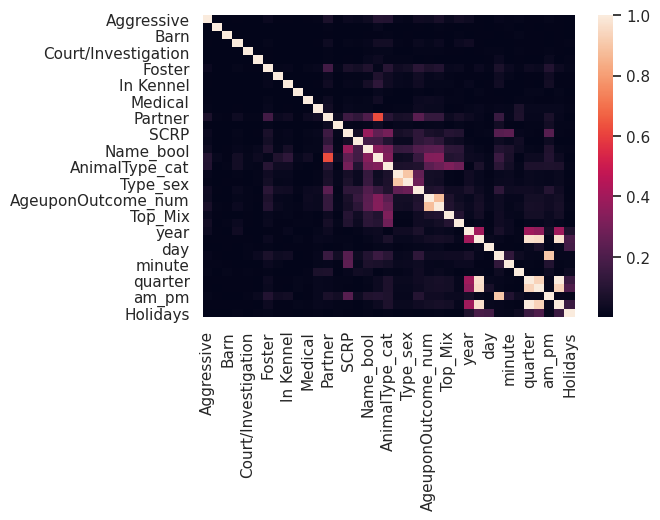

In [ ]:
train1_corr=train1.corr()
plt.figure(dpi=100)
sns.heatmap(train1_corr.abs())

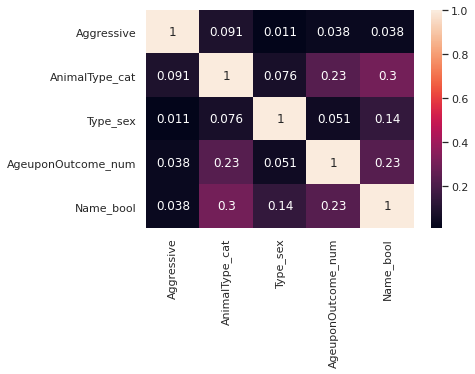

In [ ]:
train1_catdog = train1[['Aggressive', 'AnimalType_cat', "Type_sex", "AgeuponOutcome_num",'Name_bool']]
train1_catdog_corr = train1_catdog.corr()
sns.heatmap(train1_catdog_corr.abs(), annot=True)

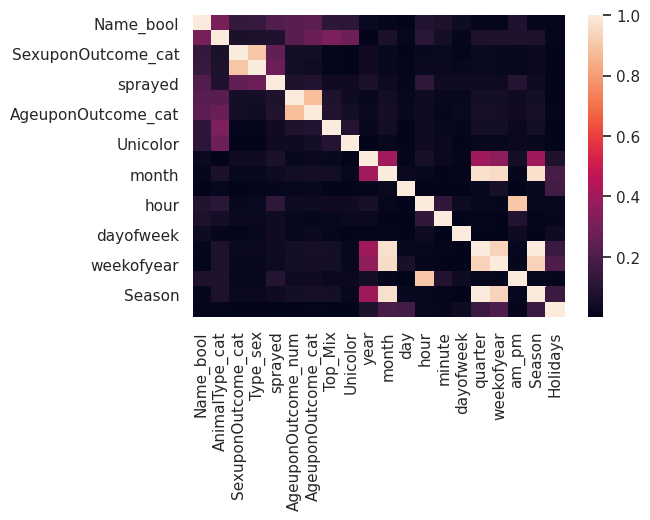

In [ ]:
train_corr = train_.corr()
plt.figure(dpi=100)
sns.heatmap(train_corr.abs())

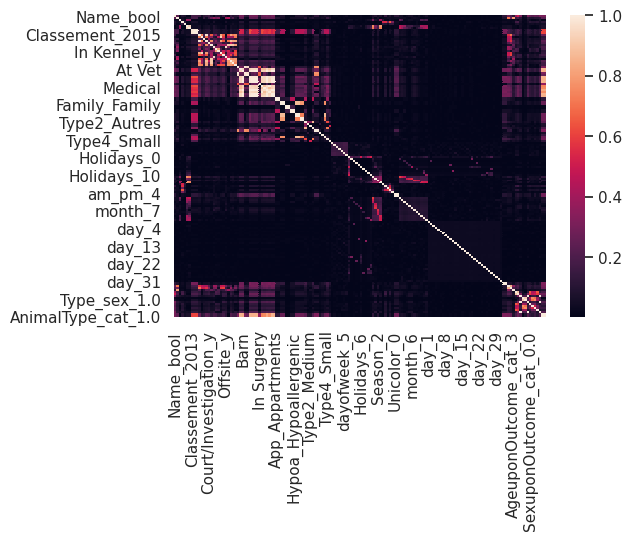

In [ ]:
train_2.columns.tolist()

train_2corr = train_2.corr()
plt.figure(dpi=100)
sns.heatmap(train_2corr.abs())

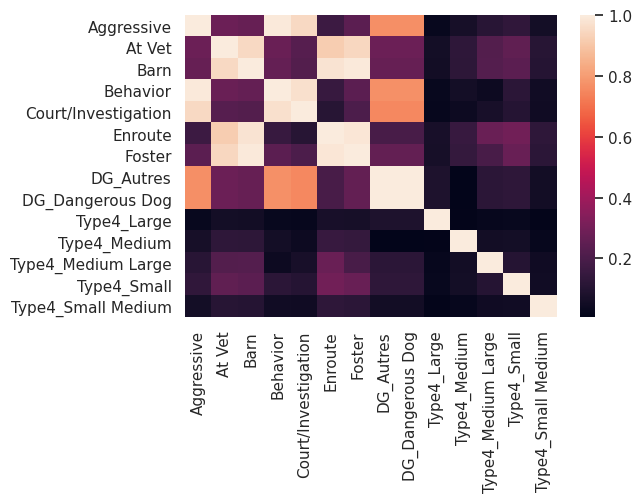

In [ ]:
train_corr2_select = train_2[['Aggressive','At Vet','Barn','Behavior','Court/Investigation','Enroute','Foster','DG_Autres','DG_Dangerous Dog','Type4_Large','Type4_Medium','Type4_Medium Large','Type4_Small','Type4_Small Medium']]
train_corr2_select = train_corr2_select.corr()
plt.figure(dpi=100)
sns.heatmap(train_corr2_select.abs())

In [ ]:
#original code

#Breed-color-shade with Logistic Regression
from nltk.corpus.reader.wordnet import NOUN
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
import re
from sklearn.feature_extraction.text import CountVectorizer, HashingVectorizer

def featuring(train):
    #train['Breed_vec'] = [''.join([WordNetLemmatizer().lemmatize(re.sub('[^A-Za-z]', ' ', line)) for line in lists]).strip() for lists in train['Breed11']]
    #train['Breed_vec2'] = [''.join([WordNetLemmatizer().lemmatize(re.sub('[^A-Za-z]', ' ', line)) for line in lists]).strip() for lists in train['Breed2']]
    #train['Color_vec'] = [''.join([WordNetLemmatizer().lemmatize(re.sub('[^A-Za-z]', ' ', line)) for line in lists]).strip() for lists in train['Color']]
    #train['Color1_vec'] = [''.join([WordNetLemmatizer().lemmatize(re.sub('[^A-Za-z]', ' ', line)) for line in lists]).strip() for lists in train['Color1']]
    #train['Color2_vec'] = [''.join([WordNetLemmatizer().lemmatize(re.sub('[^A-Za-z]', ' ', line)) for line in lists]).strip() for lists in train['Color2']]
    #train['Shade1_vec'] = [''.join([WordNetLemmatizer().lemmatize(re.sub('[^A-Za-z]', ' ', line)) for line in lists]).strip() for lists in train['Shade1']]
    #train['Shade2_vec'] = [''.join([WordNetLemmatizer().lemmatize(re.sub('[^A-Za-z]', ' ', line)) for line in lists]).strip() for lists in train['Shade2']]

    #corpustr_br = train['Breed_vec']
    #corpustr_br2 = train['Breed_vec2']
    #corpustr_col = train['Color_vec']
    #corpustr_col1 = train['Color1_vec']
    #corpustr_col2 = train['Color2_vec']
    #corpustr_sh1 = train['Shade1_vec']
    #corpustr_sh2 = train['Shade2_vec']

    #vectorizertr = CountVectorizer(stop_words='english',
    #                             ngram_range = ( 1 , 1 ),analyzer="word", 
    #                             binary=True , token_pattern=r'\w+' )

    #tfidftr_br=vectorizertr.fit_transform(corpustr_br).todense()
    #tfidftr_br2=vectorizertr.fit_transform(corpustr_br2).todense()
    #tfidftr_col=vectorizertr.fit_transform(corpustr_col).todense()
    #tfidftr_col1=vectorizertr.fit_transform(corpustr_col1).todense()
    #tfidftr_col2=vectorizertr.fit_transform(corpustr_col2).todense()
    #tfidftr_sh1=vectorizertr.fit_transform(corpustr_sh1).todense()
    #tfidftr_sh2=vectorizertr.fit_transform(corpustr_sh2).todense()

    #dt1=pd.DataFrame(tfidftr_br,dtype=float).add_suffix('_br1')
    #dt2=pd.DataFrame(tfidftr_col,dtype=float).add_suffix('_col')
    #dt3=pd.DataFrame(tfidftr_col1,dtype=float).add_suffix('_col1')
    #dt4=pd.DataFrame(tfidftr_col2,dtype=float).add_suffix('_col2')
    #dt5=pd.DataFrame(tfidftr_sh1,dtype=float).add_suffix('_sh1')
    #dt6=pd.DataFrame(tfidftr_sh2,dtype=float).add_suffix('_sh2')
    #dt7=pd.DataFrame(tfidftr_br2,dtype=float).add_suffix('_br2')
    binarize=train#.join(dt1)#.join(dt2)#.join(dt3).join(dt4).join(dt5).join(dt6).join(dt7)
    return binarize

train_2['version']='Train'
test_2['version']='Test'

result = train_2.append(test_2, ignore_index=True)

binarize=featuring(result)

binarize_train=binarize[binarize['version']=='Train']
binarize_test=binarize[binarize['version']=='Test']
print(binarize.shape)

train_select=pd.DataFrame(binarize_train.select_dtypes(include=['float64','int64','int32','float32']))
test_select=pd.DataFrame(binarize_test.select_dtypes(include=['float64','int64','int32','float32']))

print(train_select.shape)


train_select=train_select.fillna(-9999)
test_select=test_select.fillna(-9999)

(38185, 172)
(26729, 42)


In [ ]:
train_select.head()

,Name_bool,AgeuponOutcome_num,year,hour,minute,quarter,weekofyear,Classement_2013,Classement_2014,Classement_2015,Aggressive_y,At Vet_y,Barn_y,Behavior_y,Court/Investigation_y,Enroute_y,Foster_y,In Foster_y,In Kennel_y,In Surgery_y,Medical_y,Offsite_y,Partner_y,Rabies Risk_y,SCRP_y,Suffering_y,Aggressive,At Vet,Barn,Behavior,Court/Investigation,Enroute,Foster,In Foster,In Kennel,In Surgery,Medical,Offsite,Partner,Rabies Risk,SCRP,Suffering
0,0,365,2014,18,22,1,7,21.0,21.0,23.0,47.0,0.0,0.0,19.0,1.0,3.0,123.0,1.0,5.0,0.0,3.0,17.0,921.0,14.0,495.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,9.0,0.0,0.0,3.0
1,0,365,2013,12,44,4,41,-9999.0,-9999.0,-9999.0,47.0,0.0,0.0,19.0,1.0,3.0,123.0,1.0,5.0,0.0,3.0,17.0,921.0,14.0,495.0,100.0,1.0,1.0,2.0,0.0,0.0,4.0,824.0,37.0,64.0,0.0,20.0,50.0,3277.0,23.0,1327.0,500.0
2,0,730,2015,12,28,1,5,-9999.0,-9999.0,-9999.0,98.0,2.0,0.0,32.0,0.0,2.0,98.0,0.0,9.0,3.0,8.0,19.0,844.0,12.0,369.0,125.0,160.0,0.0,0.0,41.0,2.0,1.0,67.0,0.0,5.0,1.0,13.0,3.0,513.0,14.0,0.0,57.0
3,1,21,2014,19,9,3,28,-9999.0,-9999.0,-9999.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,640.0,2.0,0.0,11.0,1.0,1.0,2.0,0.0,0.0,4.0,824.0,37.0,64.0,0.0,20.0,50.0,3277.0,23.0,1327.0,500.0
4,1,730,2013,12,52,4,46,63.0,67.0,65.0,98.0,2.0,0.0,32.0,0.0,2.0,98.0,0.0,9.0,3.0,8.0,19.0,844.0,12.0,369.0,125.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,43.0,0.0,0.0,1.0


In [ ]:
train_select.corr()

,Name_bool,AgeuponOutcome_num,year,hour,minute,quarter,weekofyear,Classement_2013,Classement_2014,Classement_2015,Aggressive_y,At Vet_y,Barn_y,Behavior_y,Court/Investigation_y,Enroute_y,Foster_y,In Foster_y,In Kennel_y,In Surgery_y,Medical_y,Offsite_y,Partner_y,Rabies Risk_y,SCRP_y,Suffering_y,Aggressive,At Vet,Barn,Behavior,Court/Investigation,Enroute,Foster,In Foster,In Kennel,In Surgery,Medical,Offsite,Partner,Rabies Risk,SCRP,Suffering
Name_bool,1.000000,-0.231386,-0.030291,-0.090077,-0.074512,-0.014672,-0.010379,-0.176192,-0.178286,-0.178283,-0.163649,-0.054587,-0.119343,-0.137672,-0.165488,-0.092831,-0.019796,0.106248,0.091336,-0.068289,-0.168393,-0.058845,0.018245,-0.153770,-0.096474,-0.109834,-0.123790,0.287327,0.287019,-0.124371,-0.109199,0.286792,0.290095,0.290804,0.290512,-0.124453,0.249220,0.270826,0.284159,0.257466,0.291619,0.288969
AgeuponOutcome_num,-0.231386,1.000000,0.022887,-0.038838,0.016381,-0.051334,-0.052224,0.172153,0.180951,0.180951,0.022394,-0.015259,0.140483,-0.046821,0.159958,-0.267997,-0.373782,-0.288500,-0.335003,-0.023700,-0.000907,-0.384957,-0.444407,-0.125892,-0.206949,-0.079098,0.030755,-0.242767,-0.240045,0.032672,0.020446,-0.243360,-0.245022,-0.240835,-0.243727,0.066533,-0.232372,-0.224482,-0.242854,-0.240631,-0.243114,-0.242969
year,-0.030291,0.022887,1.000000,-0.065426,-0.029248,-0.397777,-0.361392,-0.005268,-0.004733,-0.004733,0.017765,0.010687,0.004785,0.016676,0.014840,0.007206,-0.022242,-0.012754,-0.000324,0.010792,0.007133,-0.018149,0.003634,0.013048,0.009255,0.015792,0.013654,0.004267,0.003262,0.013001,0.012508,0.004514,0.003791,0.003053,0.003838,0.013148,0.009812,0.005377,0.004867,0.007661,0.002785,0.004174
hour,-0.090077,-0.038838,-0.065426,1.000000,0.132265,-0.018068,-0.015294,0.072091,0.074189,0.074185,-0.021376,-0.008765,-0.007720,-0.021085,-0.026335,-0.004789,0.066870,0.009047,0.011374,-0.004674,-0.003343,0.066402,0.012854,-0.014958,-0.025890,-0.022875,0.016110,-0.094689,-0.094542,0.014680,0.010735,-0.097653,-0.095277,-0.095217,-0.096281,0.033564,-0.090516,-0.082514,-0.093849,-0.093425,-0.096558,-0.095620
minute,-0.074512,0.016381,-0.029248,0.132265,1.000000,-0.008009,-0.005689,0.036228,0.037772,0.037771,-0.024732,-0.013647,0.016739,-0.029559,-0.003399,-0.030952,0.017771,0.016379,0.014458,-0.016562,0.002323,0.011701,-0.019320,-0.026568,-0.049289,-0.024163,0.019580,-0.047499,-0.045408,0.020145,0.020246,-0.047242,-0.047186,-0.046801,-0.046804,0.014027,-0.041114,-0.047344,-0.046297,-0.041427,-0.046435,-0.047007
quarter,-0.014672,-0.051334,-0.397777,-0.018068,-0.008009,1.000000,0.935103,-0.044380,-0.046790,-0.046791,-0.057415,-0.014669,-0.040077,-0.053527,-0.062036,-0.027907,0.085658,0.049651,0.023803,-0.019895,-0.022025,0.067524,-0.004080,-0.048925,-0.034362,-0.036086,-0.020790,0.073906,0.072962,-0.022147,-0.018083,0.071463,0.073872,0.072829,0.073532,-0.036339,0.064488,0.065467,0.072294,0.068867,0.074206,0.072676
weekofyear,-0.010379,-0.052224,-0.361392,-0.015294,-0.005689,0.935103,1.000000,-0.044097,-0.046069,-0.046069,-0.056567,-0.010367,-0.040960,-0.052021,-0.064552,-0.027706,0.082912,0.053182,0.029179,-0.017208,-0.019512,0.064802,-0.003220,-0.048574,-0.034656,-0.033429,-0.022024,0.072185,0.071328,-0.023381,-0.019470,0.070300,0.072453,0.071454,0.072099,-0.034879,0.062719,0.064777,0.070797,0.066990,0.072679,0.071306
Classement_2013,-0.176192,0.172153,-0.005268,0.072091,0.036228,-0.044380,-0.044097,1.000000,0.981596,0.981627,0.119366,0.048138,0.075479,0.102028,0.108219,0.045529,-0.101175,-0.101314,-0.081606,0.054578,0.081070,-0.068639,-0.032816,0.088712,0.063261,0.071638,-0.093252,-0.521454,-0.504160,-0.125776,-0.199360,-0.620304,-0.529468,-0.528967,-0.540123,-0.286603,-0.608764,-0.557953,-0.539955,-0.575880,-0.515241,-0.554014
Classement_2014,-0.178286,0.180951,-0.004733,0.074189,0.037772,-0.046790,-0.046069,0.981596,1.000000,1.000000,0.121046,0.050504,0.074332,0.103662,0.108461,0.045031,-0.105789,-0.103680,-0.084122,0.056620,0.081213,-0.072828,-0.035710,0.088829,0.063962,0.07337

In [ ]:
#original code

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import log_loss
import matplotlib.pyplot as plt
import xgboost as xgb

x_train, x_test, y_train, y_test = train_test_split(train_select,Target,test_size=0.30, 
                                                    random_state=30,stratify=Target)

In [ ]:
#original code
"""
from sklearn.datasets import make_hastie_10_2
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier

#simple gmb
clf_gbm=GradientBoostingClassifier(n_estimators=100,random_state=10).fit(x_train,y_train)
clf_probs = clf_gbm.predict_proba(x_test)
print(log_loss(y_test, clf_probs))

#feature importance with gbm
import matplotlib.pyplot as plt
feature_importance = clf_gbm.feature_importances_
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
plt.subplot(1, 2, 2)
plt.barh(pos[134:], feature_importance[sorted_idx][134:], align='center')
plt.yticks(pos[134:], x_train.columns.values[sorted_idx][134:])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

"""

"\nfrom sklearn.datasets import make_hastie_10_2\nfrom sklearn.ensemble import GradientBoostingClassifier\nfrom xgboost import XGBClassifier\n\n#simple gmb\nclf_gbm=GradientBoostingClassifier(n_estimators=100,random_state=10).fit(x_train,y_train)\nclf_probs = clf_gbm.predict_proba(x_test)\nprint(log_loss(y_test, clf_probs))\n\n#feature importance with gbm\nimport matplotlib.pyplot as plt\nfeature_importance = clf_gbm.feature_importances_\nfeature_importance = 100.0 * (feature_importance / feature_importance.max())\nsorted_idx = np.argsort(feature_importance)\npos = np.arange(sorted_idx.shape[0]) + .5\nplt.subplot(1, 2, 2)\nplt.barh(pos[134:], feature_importance[sorted_idx][134:], align='center')\nplt.yticks(pos[134:], x_train.columns.values[sorted_idx][134:])\nplt.xlabel('Relative Importance')\nplt.title('Variable Importance')\nplt.show()\n\n"

In [ ]:
#original code

x_train, x_test, y_train, y_test = train_test_split(train_select,Target,test_size=0.80, 
                                                    random_state=30,stratify=Target)
dtrain1 = xgb.DMatrix(x_train,y_train,missing = -9999)
dtest1 = xgb.DMatrix(x_test,missing = -9999)
num_round = 125

#dtrain = xgb.DMatrix(train_select,Target,missing = -9999)
#dtest = xgb.DMatrix(test_select,missing = -9999)
num_round = 125

param1 = {'max_depth':7, 'eta':0.1, 'silent':1, 'objective':'multi:softprob','num_class':5,
        'eval_metric':'mlogloss','subsample':0.75,'colsample_bytree':0.85}

param2 = {'max_depth':6, 'eta':0.1, 'silent':1, 'objective':'multi:softprob','num_class':5,
        'eval_metric':'mlogloss','subsample':0.85,'colsample_bytree':0.75}

param3 = {'max_depth':8, 'eta':0.1, 'silent':1, 'objective':'multi:softprob','num_class':5,
        'eval_metric':'mlogloss','subsample':0.65,'colsample_bytree':0.75}

param4 = {'max_depth':9, 'eta':0.1, 'silent':1, 'objective':'multi:softprob','num_class':5,
        'eval_metric':'mlogloss','subsample':0.55,'colsample_bytree':0.65}

param5 = {'max_depth':12, 'eta':0.1, 'silent':1, 'objective':'multi:softprob','num_class':5,
        'eval_metric':'mlogloss','subsample':1,'colsample_bytree':1}

bst1 = xgb.train(param1, dtrain1, num_round)
bst2 = xgb.train(param2, dtrain1, num_round)
bst3 = xgb.train(param3, dtrain1, num_round)
bst4 = xgb.train(param3, dtrain1, num_round)
bst5 = xgb.train(param3, dtrain1, num_round)

ypred_submit = (bst1.predict(dtest1) + bst2.predict(dtest1) + bst3.predict(dtest1) +  bst4.predict(dtest1) +  bst5.predict(dtest1))/5
print(log_loss(y_test, ypred_submit))



0.9098640427401804


In [ ]:
y_test.head()

23766    1.0
12522    0.0
3365     2.0
16788    2.0
6157     2.0
Name: Target, dtype: float64

In [ ]:
x_test.head()

,Name_bool,AgeuponOutcome_num,year,hour,minute,quarter,weekofyear,Classement_2013,Classement_2014,Classement_2015,Aggressive_y,At Vet_y,Barn_y,Behavior_y,Court/Investigation_y,Enroute_y,Foster_y,In Foster_y,In Kennel_y,In Surgery_y,Medical_y,Offsite_y,Partner_y,Rabies Risk_y,SCRP_y,Suffering_y,Aggressive,At Vet,Barn,Behavior,Court/Investigation,Enroute,Foster,In Foster,In Kennel,In Surgery,Medical,Offsite,Partner,Rabies Risk,SCRP,Suffering
23766,0,730,2016,15,33,1,4,2.0,2.0,2.0,98.0,2.0,0.0,32.0,0.0,2.0,98.0,0.0,9.0,3.0,8.0,19.0,844.0,12.0,369.0,125.0,14.0,0.0,0.0,2.0,0.0,0.0,42.0,0.0,2.0,0.0,1.0,2.0,177.0,2.0,0.0,18.0
12522,0,3285,2014,15,40,4,49,76.0,84.0,77.0,4.0,0.0,0.0,1.0,0.0,0.0,17.0,0.0,1.0,0.0,1.0,0.0,49.0,2.0,1.0,30.0,5.0,0.0,0.0,4.0,1.0,0.0,2.0,0.0,1.0,0.0,0.0,1.0,22.0,0.0,0.0,1.0
3365,0,730,2014,17,50,1,13,-9999.0,-9999.0,-9999.0,98.0,2.0,0.0,32.0,0.0,2.0,98.0,0.0,9.0,3.0,8.0,19.0,844.0,12.0,369.0,125.0,0.0,0.0,0.0,0.0,0.0,1.0,56.0,4.0,7.0,0.0,2.0,1.0,143.0,1.0,69.0,55.0
16788,0,180,2014,14,14,4,42,114.0,119.0,114.0,1.0,0.0,0.0,0.0,0.0,0.0,32.0,1.0,1.0,0.0,3.0,1.0,167.0,0.0,64.0,13.0,3.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,42.0,0.0,0.0,1.0
6157,0,60,2014,14,48,3,27,-9999.0,-9999.0,-9999.0,0.0,0.0,0.0,0.0,0.0,1.0,623.0,4.0,8.0,0.0,4.0,54.0,626.0,4.0,15.0,31.0,1.0,1.0,2.0,0.0,0.0,4.0,824.0,37.0,64.0,0.0,20.0,50.0,3277.0,23.0,1327.0,500.0


In [ ]:
#original code

param2 = {'max_depth':4, 'eta':0.1, 'silent':1, 'objective':'multi:softprob','num_class':5,
        'eval_metric':'mlogloss','subsample':0.85,'colsample_bytree':0.75}

x_train2, x_test2, y_train2, y_test2 = train_test_split(ypred_submit,y_test,test_size=0.80, 
                                                    random_state=30,stratify=y_test)

dtrain2 = xgb.DMatrix(x_train2,y_train2,missing = -9999)
dtest2 = xgb.DMatrix(x_test2,missing = -9999)

bst2 = xgb.train(param2, dtrain2, num_round)
ypred_submit2 = bst2.predict(dtest2)
print(log_loss(y_test2, ypred_submit2))


0.8924731075266031


In [ ]:
#original code

dtrain = xgb.DMatrix(train_select,Target,missing = -9999)
dtest = xgb.DMatrix(test_select,missing = -9999)
num_round = 125

param1 = {'max_depth':7, 'eta':0.1, 'silent':1, 'objective':'multi:softprob','num_class':5,
        'eval_metric':'mlogloss','subsample':0.75,'colsample_bytree':0.85}

param2 = {'max_depth':6, 'eta':0.1, 'silent':1, 'objective':'multi:softprob','num_class':5,
        'eval_metric':'mlogloss','subsample':0.85,'colsample_bytree':0.75}

param3 = {'max_depth':8, 'eta':0.1, 'silent':1, 'objective':'multi:softprob','num_class':5,
        'eval_metric':'mlogloss','subsample':0.65,'colsample_bytree':0.75}

param4 = {'max_depth':9, 'eta':0.1, 'silent':1, 'objective':'multi:softprob','num_class':5,
        'eval_metric':'mlogloss','subsample':0.55,'colsample_bytree':0.65}

param5 = {'max_depth':12, 'eta':0.1, 'silent':1, 'objective':'multi:softprob','num_class':5,
        'eval_metric':'mlogloss','subsample':1,'colsample_bytree':1}

bst1 = xgb.train(param1, dtrain, num_round)
bst2 = xgb.train(param2, dtrain, num_round)
bst3 = xgb.train(param3, dtrain, num_round)
bst4 = xgb.train(param3, dtrain, num_round)
bst5 = xgb.train(param3, dtrain, num_round)

ypred_submit = (bst1.predict(dtest) + bst2.predict(dtest) + bst3.predict(dtest) +  bst4.predict(dtest) +  bst5.predict(dtest))/5

In [ ]:
#original code

ypred_submit=pd.DataFrame(ypred_submit)

submission = pd.DataFrame()
submission["id"] = Id_ts.values
submission["Adoption"]= ypred_submit[2]
submission["Died"]= ypred_submit[4]
submission["Euthanasia"]= ypred_submit[1]
submission["Return_to_owner"]= ypred_submit[0]
submission["Transfer"]= ypred_submit[3]

submission.to_csv("sub.csv",index=False)

## 4. Outcomes

### 4a. Analyze the effectiveness (accuracy) of the ADS by comparing its performance across different subpopulations. 
We compared the cross-validation accuracy of this ADS for dogs and cats respectively.

In [ ]:
from numpy import loadtxt
import xgboost
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

# Accuracy of the model using cross_val_score
model = xgboost.XGBClassifier()
kfold = KFold(n_splits=10, random_state=7)
results = cross_val_score(model, x_test, y_test, cv=kfold)
print("Accuracy: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


Accuracy: 62.61% (0.99%)


In [ ]:
# 4a. Analyze the effectiveness (accuracy) of the ADS by comparing its performance across different subpopulations. 
# the accuracy of the ADS of dogs vs. the accuracy of the ADS of cats

# get the index for cats and dogs from binarize_train
cat_index = []
dog_index = []
for i in binarize_train.index:
  if binarize_train['AnimalType'][i] == 'Cat':
    cat_index.append(i)
  else:
     if binarize_train['AnimalType'][i] == 'Dog':
      dog_index.append(i)

# match the index for cats and dogs in x_test

test_cat_index = []
test_dog_index = []
for j in x_test.index:
  if j in cat_index:
    test_cat_index.append(j)
  else:
     if j in dog_index: 
       test_dog_index.append(j)
print(len(test_cat_index), len(test_dog_index), len(x_test) )

8876 12508 21384


In [ ]:
# run the model for cats in x_test
dtest_cat = xgb.DMatrix(x_test.loc[test_cat_index],missing = -9999)
ypred_cat = (bst1.predict(dtest_cat) + bst2.predict(dtest_cat) + bst3.predict(dtest_cat) +  bst4.predict(dtest_cat) +  bst5.predict(dtest_cat))/5
print("Log loss:", log_loss(y_test.loc[test_cat_index], ypred_cat))
results_cat = cross_val_score(model, x_test.loc[test_cat_index], y_test.loc[test_cat_index], cv=kfold)
print("Accuracy: %.2f%% (%.2f%%)" % (results_cat.mean()*100, results_cat.std()*100))

Log loss: 0.4279023691392351
Accuracy: 76.49% (1.89%)


In [ ]:
# run the model for dogs in x_test
dtest_dog = xgb.DMatrix(x_test.loc[test_dog_index],missing = -9999)
ypred_dog = (bst1.predict(dtest_dog) + bst2.predict(dtest_dog) + bst3.predict(dtest_dog) +  bst4.predict(dtest_dog) +  bst5.predict(dtest_dog))/5
print("Log loss:", log_loss(y_test.loc[test_dog_index], ypred_dog))
results_dog = cross_val_score(model, x_test.loc[test_dog_index], y_test.loc[test_dog_index], cv=kfold)
print("Accuracy: %.2f%% (%.2f%%)" % (results_dog.mean()*100, results_dog.std()*100))

Log loss: 0.7014786862199893
Accuracy: 54.64% (1.42%)


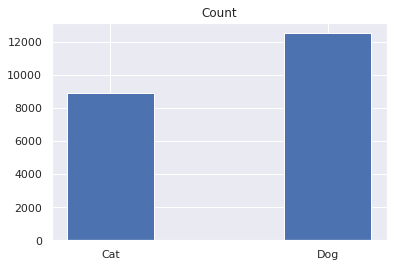

In [ ]:

N=2
ind = np.arange(N)
a_labels = ['Cat', 'Dog']
a_count = [8876, 12508]
a_ll = [0.4279023691392351, 0.7014786862199893]
a_acc = [0.7649, 0.5464]
 
width = 0.4     
plt.bar(ind, a_count, width)
plt.title("Count")
plt.xticks(ind, a_labels)

plt.show()


(0.0, 1.0)

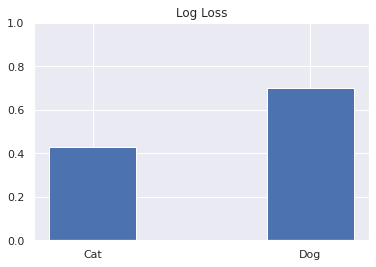

In [ ]:
plt.bar(ind, a_ll, width)
plt.title("Log Loss")
plt.xticks(ind, a_labels)
plt.ylim([0, 1])

(0.0, 1.0)

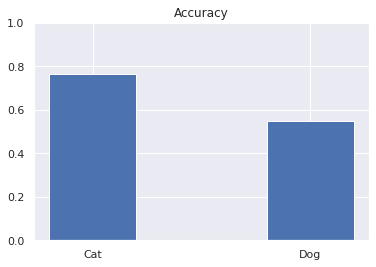

In [ ]:
plt.bar(ind, a_acc, width)
plt.title("Accuracy")
plt.xticks(ind, a_labels)
plt.ylim([0, 1])

### 4b. Select one or several fairness or diversity measures and quantify the fairness or diversity of this ADS 
We evaluated how this RDS make predictions for animals of different sexes. For the purpose of fairness measurement, the outcomes are grouped into Adoption and Other. More specifically, if the highest probability of the outcome predicted for an animal is Adoption, then it will be labled as Adoption; if the highest probability of the outcome predicted for an animal is Died, Euthanasia, Return_to_owner, or Transfer, it will be labeled as Other. Since Adoption is the most desired outcome, it is evaluated as the positive outcome while Other is evaluated as the negative outcome.

For each group, we evaluated the distribution of outcomes in true lables and predicted lables, the accuracy of predicting the correct label, and the False Negative Rate (FNR) and False Positive Rate (FPR).

In [ ]:
# get the index for animals of different sexes
neutered_male = []
spayed_female = []
intact_male = []
intact_female= []

for m in binarize_train.index:
  if binarize_train['SexuponOutcome'][m] == 'Neutered Male':
    neutered_male.append(m)
  elif binarize_train['SexuponOutcome'][m] == 'Spayed Female':
    spayed_female.append(m)
  elif binarize_train['SexuponOutcome'][m] == 'Intact Male':
    intact_male.append(m)
  elif binarize_train['SexuponOutcome'][m] == 'Intact Female':
    intact_female.append(m)

# match the index for sexes in x_test

test_neutered_male = []
test_spayed_female = []
test_intact_male = []
test_intact_female = []

for n in x_test.index:
  if n in neutered_male:
    test_neutered_male.append(n)
  elif n in spayed_female: 
    test_spayed_female.append(n)
  elif n in intact_male: 
    test_intact_male.append(n)
  elif n in intact_female: 
    test_intact_female.append(n)

print('neutered_male:', len(test_neutered_male), 'spayed_female:', len(test_spayed_female), 'intact_male:', len(test_intact_male), 'intact_female:',len(test_intact_female))

neutered_male: 7834 spayed_female: 7095 intact_male: 2791 intact_female: 2796


1) Neutered Male

In [ ]:
# run the model for test_neutered_male in x_test
dtest_neutered_male = xgb.DMatrix(x_test.loc[test_neutered_male],missing = -9999)
ypred_neutered_male = (bst1.predict(dtest_neutered_male) + bst2.predict(dtest_neutered_male) + bst3.predict(dtest_neutered_male) +  bst4.predict(dtest_neutered_male) +  bst5.predict(dtest_neutered_male))/5
print("Log loss:", log_loss(y_test.loc[test_neutered_male], ypred_neutered_male))

Log loss: 0.6491037928711189


In [ ]:
# Make a table of predicted outcome and true outcome for test_neutered_male in x_test
# Binary outcome: Adoption (2 has the highest probability), Other

df1 = pd.DataFrame(ypred_neutered_male)
df1['Max'] = df1.idxmax(axis=1)
Predict_outcome = []
for num in df1['Max']:
  if num == 2:
    outcome = 'Adoption'
  else:
    outcome = 'Other'
  Predict_outcome.append(outcome)
df1['Predict'] = Predict_outcome

True_outcome = []
for num2 in y_test.loc[test_neutered_male]:
  if num2 == 2:
    outcome = 'Adoption'
  else:
    outcome = 'Other'
  True_outcome.append(outcome)
df1['True'] = True_outcome
df1.head()

,0,1,2,3,4,Max,Predict,True
0,0.340895,0.059193,0.433937,0.163729,0.002247,2,Adoption,Other
1,0.005489,0.005081,0.630807,0.356863,0.001760,2,Adoption,Adoption
2,0.177778,0.020123,0.534814,0.265473,0.001811,2,Adoption,Adoption
3,0.437587,0.244403,0.141898,0.175641,0.000470,0,Other,Other
4,0.196404,0.009140,0.121390,0.672194,0.000872,3,Other,Other


<function matplotlib.pyplot.show>

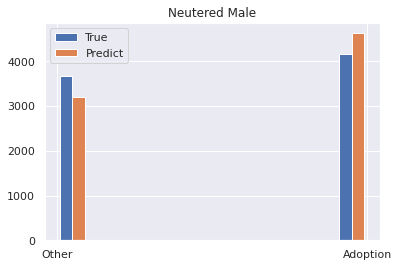

In [ ]:
# distribution of Adoption and Other
plt.hist([df1['True'], df1['Predict']], label=['True', 'Predict'])
plt.legend()
plt.title('Neutered Male')
plt.show

Confusion Matrix:
[[3659  508]
 [ 966 2701]] 

Accuracy: 0.8118458003574164
False Negative Rate: 0.12191024718022558
False Positive Rate: 0.2634305972184347 



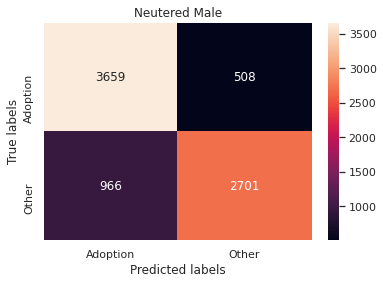

In [ ]:
# confusion matrix, FNR, FPR
import sklearn
import seaborn as sns
cm1 = sklearn.metrics.confusion_matrix(df1['True'], df1['Predict'])
print("Confusion Matrix:")
print(cm1, '\n')

tp, fn, fp, tn = cm1.ravel()
acc1 = (tp+tn)/(tp+fp+tn+fn)
FNR1 = fn/(fn+tp)
FPR1 = fp/(fp+tn)
print("Accuracy:", acc1)
print("False Negative Rate:", FNR1)
print("False Positive Rate:", FPR1, '\n')


ax= plt.subplot()
sns.heatmap(cm1, annot=True, fmt='g', ax=ax);  
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Neutered Male'); 
class_names = ['Adoption', 'Other']
ax.xaxis.set_ticklabels(class_names); 
ax.yaxis.set_ticklabels(class_names);

2) Spayed Female

In [ ]:
# run the model for test_spayed_female in x_test
dtest_spayed_female = xgb.DMatrix(x_test.loc[test_spayed_female],missing = -9999)
ypred_spayed_female = (bst1.predict(dtest_spayed_female) + bst2.predict(dtest_spayed_female) + bst3.predict(dtest_spayed_female) +  bst4.predict(dtest_spayed_female) +  bst5.predict(dtest_spayed_female))/5
print("Log loss:", log_loss(y_test.loc[test_spayed_female], ypred_spayed_female))

Log loss: 0.6223106333634791


In [ ]:
# Make a table of predicted outcome and true outcome for test_spayed_female in x_test
# Binary outcome: Adoption (2 has the highest probability), Other

df2 = pd.DataFrame(ypred_spayed_female)
df2['Max'] = df2.idxmax(axis=1)
Predict_outcome = []
for num in df2['Max']:
  if num == 2:
    outcome = 'Adoption'
  else:
    outcome = 'Other'
  Predict_outcome.append(outcome)
df2['Predict'] = Predict_outcome

True_outcome = []
for num2 in y_test.loc[test_spayed_female]:
  if num2 == 2:
    outcome = 'Adoption'
  else:
    outcome = 'Other'
  True_outcome.append(outcome)
df2['True'] = True_outcome
df2.head()

,0,1,2,3,4,Max,Predict,True
0,0.556769,0.143888,0.222528,0.071554,0.005261,0,Other,Other
1,0.278176,0.030164,0.540258,0.147513,0.003889,2,Adoption,Adoption
2,0.070800,0.009051,0.366204,0.552514,0.001430,3,Other,Adoption
3,0.009136,0.004727,0.731478,0.252192,0.002467,2,Adoption,Adoption
4,0.271770,0.017570,0.316940,0.390558,0.003162,3,Other,Other


<function matplotlib.pyplot.show>

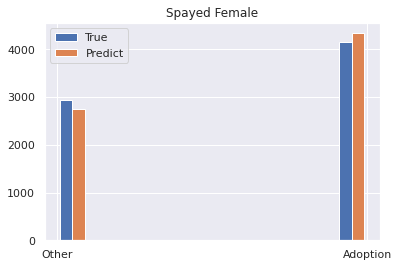

In [ ]:
# distribution of Adoption and Other
plt.hist([df2['True'], df2['Predict']], label=['True', 'Predict'])
plt.legend()
plt.title('Spayed Female')
plt.show

Confusion Matrix:
[[3608  547]
 [ 732 2208]] 

Accuracy: 0.8197322057787174
False Negative Rate: 0.13164861612515041
False Positive Rate: 0.24897959183673468 



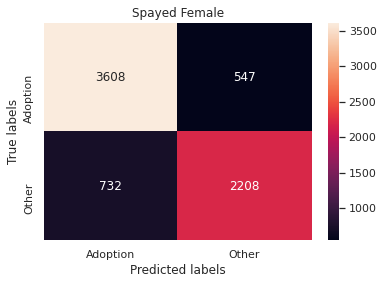

In [ ]:
# confusion matrix, FNR, FPR
cm2 = sklearn.metrics.confusion_matrix(df2['True'], df2['Predict'])
print("Confusion Matrix:")
print(cm2, '\n')

tp, fn, fp, tn = cm2.ravel()
acc2 = (tp+tn)/(tp+fp+tn+fn)
FNR2 = fn/(fn+tp)
FPR2 = fp/(fp+tn)

print("Accuracy:", acc2)
print("False Negative Rate:", FNR2)
print("False Positive Rate:", FPR2, '\n')


ax= plt.subplot()
sns.heatmap(cm2, annot=True, fmt='g', ax=ax);  
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Spayed Female'); 
class_names = ['Adoption', 'Other']
ax.xaxis.set_ticklabels(class_names); 
ax.yaxis.set_ticklabels(class_names);

3) Intact Male

In [ ]:
# run the model for test_intact_male in x_test
dtest_intact_male = xgb.DMatrix(x_test.loc[test_intact_male],missing = -9999)
ypred_intact_male = (bst1.predict(dtest_intact_male) + bst2.predict(dtest_intact_male) + bst3.predict(dtest_intact_male) +  bst4.predict(dtest_intact_male) +  bst5.predict(dtest_intact_male))/5
print("Log loss:", log_loss(y_test.loc[test_intact_male], ypred_intact_male))

Log loss: 0.5323419430208386


In [ ]:
# Make a table of predicted outcome and true outcome for test_intact_male in x_test
# Binary outcome: Adoption (2 has the highest probability), Other

df3 = pd.DataFrame(ypred_intact_male)
df3['Max'] = df3.idxmax(axis=1)
Predict_outcome = []
for num in df3['Max']:
  if num == 2:
    outcome = 'Adoption'
  else:
    outcome = 'Other'
  Predict_outcome.append(outcome)
df3['Predict'] = Predict_outcome

True_outcome = []
for num2 in y_test.loc[test_intact_male]:
  if num2 == 2:
    outcome = 'Adoption'
  else:
    outcome = 'Other'
  True_outcome.append(outcome)
df3['True'] = True_outcome
df3.head()

,0,1,2,3,4,Max,Predict,True
0,0.008266,0.044396,0.002078,0.925526,0.019733,3,Other,Other
1,0.001050,0.013959,0.000460,0.983958,0.000572,3,Other,Other
2,0.006906,0.012102,0.467466,0.509589,0.003938,3,Other,Other
3,0.002987,0.241058,0.310584,0.370570,0.074801,3,Other,Other
4,0.002393,0.012677,0.000584,0.981639,0.002707,3,Other,Other


<function matplotlib.pyplot.show>

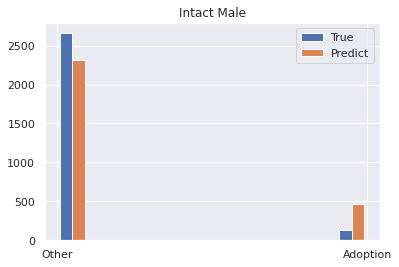

In [ ]:
# distribution of Adoption and Other
plt.hist([df3['True'], df3['Predict']], label=['True', 'Predict'])
plt.legend()
plt.title('Intact Male')
plt.show

Confusion Matrix:
[[ 107   25]
 [ 363 2296]] 

Accuracy: 0.8609817269795772
False Negative Rate: 0.1893939393939394
False Positive Rate: 0.13651748777735992 



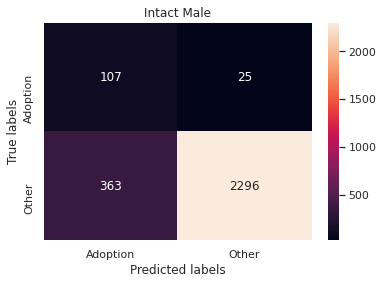

In [ ]:
# confusion matrix, FNR, FPR
cm3 = sklearn.metrics.confusion_matrix(df3['True'], df3['Predict'])
print("Confusion Matrix:")
print(cm3, '\n')

tp, fn, fp, tn = cm3.ravel()
acc3 = (tp+tn)/(tp+fp+tn+fn)
FNR3 = fn/(fn+tp)
FPR3 = fp/(fp+tn)
print("Accuracy:", acc3)
print("False Negative Rate:", FNR3)
print("False Positive Rate:", FPR3, '\n')

ax= plt.subplot()
sns.heatmap(cm3, annot=True, fmt='g', ax=ax);  
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Intact Male'); 
class_names = ['Adoption', 'Other']
ax.xaxis.set_ticklabels(class_names); 
ax.yaxis.set_ticklabels(class_names);

4) Intact Female

In [ ]:
# run the model for test_intact_female in x_test
dtest_intact_female = xgb.DMatrix(x_test.loc[test_intact_female],missing = -9999)
ypred_intact_female = (bst1.predict(dtest_intact_female) + bst2.predict(dtest_intact_female) + bst3.predict(dtest_intact_female) +  bst4.predict(dtest_intact_female) +  bst5.predict(dtest_intact_female))/5
print("Log loss:", log_loss(y_test.loc[test_intact_female], ypred_intact_female))

Log loss: 0.502429204223926


In [ ]:
# Make a table of predicted outcome and true outcome for test_intact_female in x_test
# Binary outcome: Adoption (2 has the highest probability), Other

df4 = pd.DataFrame(ypred_intact_female)
df4['Max'] = df4.idxmax(axis=1)
Predict_outcome = []
for num in df4['Max']:
  if num == 2:
    outcome = 'Adoption'
  else:
    outcome = 'Other'
  Predict_outcome.append(outcome)
df4['Predict'] = Predict_outcome

True_outcome = []
for num2 in y_test.loc[test_intact_female]:
  if num2 == 2:
    outcome = 'Adoption'
  else:
    outcome = 'Other'
  True_outcome.append(outcome)
df4['True'] = True_outcome
df4.head()

,0,1,2,3,4,Max,Predict,True
0,0.111461,0.386834,0.080166,0.416600,0.004939,3,Other,Other
1,0.096401,0.138885,0.316486,0.445317,0.002910,3,Other,Other
2,0.009933,0.175696,0.339424,0.422618,0.052329,3,Other,Other
3,0.003431,0.030743,0.209999,0.737823,0.018004,3,Other,Other
4,0.002181,0.031883,0.929283,0.026260,0.010394,2,Adoption,Other


<function matplotlib.pyplot.show>

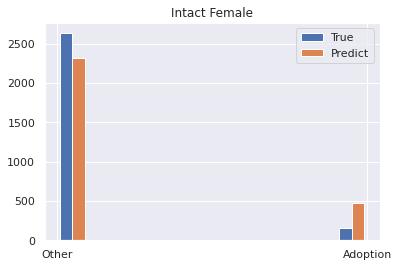

In [ ]:
# distribution of Adoption and Other
plt.hist([df4['True'], df4['Predict']], label=['True', 'Predict'])
plt.legend()
plt.title('Intact Female')
plt.show

Confusion Matrix:
[[ 131   30]
 [ 344 2291]] 

Accurcy: 0.8662374821173104
False Negative Rate: 0.18633540372670807
False Positive Rate: 0.13055028462998103 



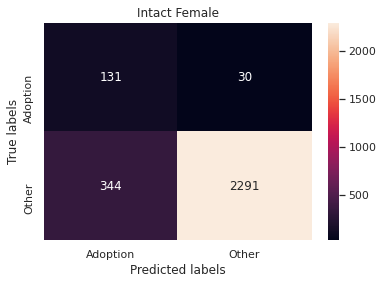

In [ ]:
# confusion matrix, FNR, FPR
cm4 = sklearn.metrics.confusion_matrix(df4['True'], df4['Predict'])
print("Confusion Matrix:")
print(cm4, '\n')

tp, fn, fp, tn = cm4.ravel()
FNR4 = fn/(fn+tp)
FPR4 = fp/(fp+tn)
acc4 = (tp+tn)/(tp+fp+tn+fn)
print('Accurcy:', acc4)
print("False Negative Rate:", FNR4)
print("False Positive Rate:", FPR4, "\n")

ax= plt.subplot()
sns.heatmap(cm4, annot=True, fmt='g', ax=ax);  
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Intact Female'); 
class_names = ['Adoption', 'Other']
ax.xaxis.set_ticklabels(class_names); 
ax.yaxis.set_ticklabels(class_names);

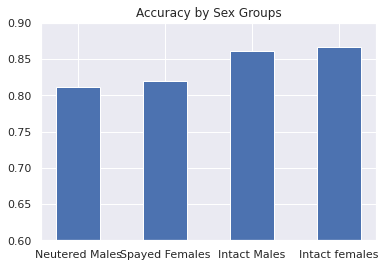

In [ ]:
N=4
sex_labels = ['Neutered Males', 'Spayed Females', 'Intact Males', 'Intact females']
acc = [acc1, acc2, acc3, acc4]

# x_pos = [i for i, _ in enumerate(x)]
ind = np.arange(N) 
width = 0.5       
plt.bar(ind, acc, width)

plt.title("Accuracy by Sex Groups")

plt.xticks(ind, sex_labels)
plt.ylim([0.6, 0.9])
plt.show()

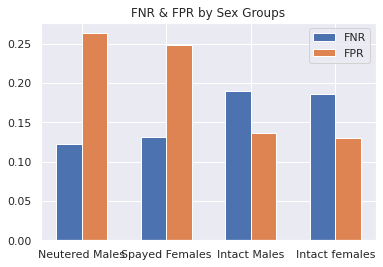

In [ ]:
N = 4
FNR = (FNR1, FNR2, FNR3, FNR4)
FPR = (FPR1, FPR2, FPR3, FPR4)

ind = np.arange(N) 
width = 0.3       
plt.bar(ind, FNR, width, label='FNR')
plt.bar(ind + width, FPR, width,label='FPR')

plt.title('FNR & FPR by Sex Groups')

plt.xticks(ind + width / 2, ('Neutered Males', 'Spayed Females', 'Intact Males', 'Intact females'))
plt.legend(loc='best')
plt.show()

### 4c. Develop additional methods for analyzing ADS performance

We used LIME to further explore which features are important in explaining the predictions and how they contribute to the predictions.

In [ ]:
!pip install -U -q lime
import lime
import lime.lime_tabular
from lime import submodular_pick

class_names = ["Return_to_owner", "Euthanasia", "Adoption", "Transfer", "Died"]
feature_names = x_train.columns[:]
print("Class names:", class_names)
print("Feature names:", feature_names)

     |████████████████████████████████| 276kB 18.7MB/s 
Class names: ['Return_to_owner', 'Euthanasia', 'Adoption', 'Transfer', 'Died']
Feature names: Index(['Name_bool', 'AgeuponOutcome_num', 'year', 'hour', 'minute', 'quarter',
       'weekofyear', 'Classement_2013', 'Classement_2014', 'Classement_2015',
       'Aggressive_y', 'At Vet_y', 'Barn_y', 'Behavior_y',
       'Court/Investigation_y', 'Enroute_y', 'Foster_y', 'In Foster_y',
       'In Kennel_y', 'In Surgery_y', 'Medical_y', 'Offsite_y', 'Partner_y',
       'Rabies Risk_y', 'SCRP_y', 'Suffering_y', 'Aggressive', 'At Vet',
       'Barn', 'Behavior', 'Court/Investigation', 'Enroute', 'Foster',
       'In Foster', 'In Kennel', 'In Surgery', 'Medical', 'Offsite', 'Partner',
       'Rabies Risk', 'SCRP', 'Suffering'],
      dtype='object')


In [ ]:
# Since all the data is already processed into numerical values, we want to look at their unique values to determine whether the varibles are categorical 
for col in x_train.columns:
  uni = x_train[col].unique()
  p = list(x_train.columns).index(col)
  print(p,":", col, '\n', uni)
  print("==========================", '\n')

0 : Name_bool 
 [0 1]

1 : AgeuponOutcome_num 
 [ 365   28 4380   30 1825   14  730  300  240   90   60 2555 3285 3650
  180  120  150 1460 1095 2190  210  270 2920    1    2 5475 4015   21
 5840    7 5110    3    4 4745   35    0  330 6570 6205    6    5 6935]

2 : year 
 [2014 2015 2013 2016]

3 : hour 
 [13 14 12 17 15 18 16 19  8 11 10  9  0 23  7 20 22 21]

4 : minute 
 [ 9 35 11 10 36  1 28  2 44 26 16 40 29 41 48 20 46 21 19 45 32 50 58 55
 37 49 30 57  4 43 14  3 54  5  0 52 56  7 13 25 18 27 38 42  6 15 47 24
 59 39 22 33 17 34  8 53 51 12 31 23]

5 : quarter 
 [1 2 3 4]

6 : weekofyear 
 [ 8 24 35 51 33 18 26 52 48 12 47  5 40 29  9 23 36 42 32 37  7 22 14 30
 41  6 16 34  2 49 43 45 20 28  1 25  4  3 50 15 27 13 11 38 53 21 39 46
 31 44 10 19 17]

7 : Classement_2013 
 [-9.999e+03  2.000e+00  4.100e+01  1.000e+00  6.000e+00  9.000e+00
  7.000e+00  3.100e+01  1.000e+01  2.000e+01  4.000e+00  8.000e+00
  4.400e+01  1.200e+02  1.700e+01  3.000e+00  5.900e+01  2.700e+01
  1.900e

In [ ]:
categorical_features = [0, 11, 12, 14, 15, 19, 27, 28, 30, 31, 35]
x_train = x_train.astype(int)

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(x_train.to_numpy(), 
                                                   feature_names=feature_names,
                                                   class_names=class_names,
                                                   categorical_features=categorical_features 
                                                   )

In [ ]:
# Initialize the SP object
def predict_fn(dtest):
  dtest = pd.DataFrame(dtest, columns=feature_names)
  dtest = xgb.DMatrix(dtest, missing=-9999)
  y = (bst1.predict(dtest) + bst2.predict(dtest) + bst3.predict(dtest) +  bst4.predict(dtest) +  bst5.predict(dtest))/5
  return y
sp_obj = submodular_pick.SubmodularPick(explainer, x_train.values, predict_fn, sample_size=500, num_features=5, num_exps_desired=10)

In [ ]:
# find the best indices from the test for explanation
sp_obj.V

[90, 44, 91, 343, 248, 434, 197, 156, 333, 426]

In [ ]:
#get explantions for each of those examples

for ind in sp_obj.V:
    exp = explainer.explain_instance(x_train.values[ind], predict_fn, num_features=5, top_labels=5)
    print("Actual class: ", y_train.iloc[ind])
    exp.show_in_notebook()
    print("==========================", '\n')

Actual class:  3.0



Actual class:  3.0



Actual class:  0.0



Actual class:  3.0



Actual class:  2.0



Actual class:  0.0



Actual class:  3.0



Actual class:  3.0



Actual class:  2.0



Actual class:  2.0
